# Telco - Churn Project
## Business Analytics & Data Mining,  A.A. 2019-2020

#### Checchin Massimo, Corvi Andrea, Malerba Edoardo, Noseda Alessandro

## Required Libraries

In [2]:
from __future__ import print_function, division
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pickle as pkl
import sklearn
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, roc_curve, precision_recall_curve
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import svm
from sklearn.ensemble import VotingClassifier 
from yellowbrick.classifier import DiscriminationThreshold
import xgboost as xgb
import lime.lime_tabular
import shap

In [3]:
import warnings
warnings.filterwarnings('ignore')

The following functions are loaded here and required during the construction of the models

In [4]:
def print_cv(cv):
    print('\n'.join([str((x, y, z)) for (x, y, z) in zip(cv.cv_results_['params'], cv.cv_results_['mean_train_score'], cv.cv_results_['mean_test_score'])]))

In [5]:
def pretty_confusion_matrix(y, preds):
    return pd.DataFrame(confusion_matrix(y, preds),
                        columns=pd.MultiIndex(levels=[['prediction'], ['0', '1']], labels=[[0, 0], [0, 1]]),
                        index=pd.MultiIndex(levels=[['target'], ['0', '1']], labels=[[0, 0], [0, 1]]))
#in case doen't work, change labels with codes

# Preprocess

We import the starting dataset and define `SeniorCitizen` as a string and `space` as missing

In [6]:
df = pd.read_csv("TelcoChurn.csv", dtype={"SeniorCitizen":str},na_values=[' '])
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [7]:
df.isna().sum()

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

By analyzing the missing values, we discover that only `Totalcharges` containes missing values codified as `NaN`. This happens when `Tenure` is equal to zero and, since `Totalcharges` is similar to the product between `Tenure` and `Monthlycharges`, we substitute these missings in `Totalcharges` with 0.

In [8]:
df.replace(np.nan,0,inplace=True)
df.isna().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [9]:
len(df.customerID.unique()) #we checked that were unique customers

7043

In [10]:
df.describe()

,tenure,MonthlyCharges,TotalCharges
count,7043.000000,7043.000000,7043.000000
mean,32.371149,64.761692,2279.734304
std,24.559481,30.090047,2266.794470
min,0.000000,18.250000,0.000000
25%,9.000000,35.500000,398.550000
50%,29.000000,70.350000,1394.550000
75%,55.000000,89.850000,3786.600000
max,72.000000,118.750000,8684.800000


In [11]:
df.dtypes

customerID           object
gender               object
SeniorCitizen        object
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                object
dtype: object

We decide to merge `PhoneService` and `MultipleLines` in `PhoneLines` because, combined, they provide the same information.

In [12]:
df.MultipleLines.replace(["No phone service","No","Yes"],["No", "Single", "Multiple"], inplace=True)
df.rename(columns={'MultipleLines':'PhoneLines'}, inplace=True)
df.drop("PhoneService", 1, inplace=True)

In [13]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Single,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Single,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Single,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


We add a new column named `TotalServices` as the sum of the online services to analyze the cumulated effect of these services.
For this reason we temporarily change the configuration of the variables related to the services.

In [14]:
df["OnlineSecurity"] = df["OnlineSecurity"].apply(lambda x: 1 if x == 'Yes' else 0)
df["OnlineBackup"] = df["OnlineBackup"].apply(lambda x: 1 if x == 'Yes' else 0)
df["DeviceProtection"] = df["DeviceProtection"].apply(lambda x: 1 if x == 'Yes' else 0)
df["TechSupport"] = df["TechSupport"].apply(lambda x: 1 if x == 'Yes' else 0)
df["StreamingTV"] = df["StreamingTV"].apply(lambda x: 1 if x == 'Yes' else 0)
df["StreamingMovies"] = df["StreamingMovies"].apply(lambda x: 1 if x == 'Yes' else 0)

In [15]:
df['TotalServices']=df["OnlineSecurity"]+df["OnlineBackup"]+df["DeviceProtection"]+df["TechSupport"]+df["StreamingTV"]+df["StreamingMovies"] 

In [16]:
df["OnlineSecurity"] = df["OnlineSecurity"].apply(lambda x: 'Yes' if x == 1 else 'No')
df["OnlineBackup"] = df["OnlineBackup"].apply(lambda x: 'Yes' if x == 1 else 'No')
df["DeviceProtection"] = df["DeviceProtection"].apply(lambda x: 'Yes' if x == 1 else 'No')
df["TechSupport"] = df["TechSupport"].apply(lambda x: 'Yes' if x == 1 else 'No')
df["StreamingTV"] = df["StreamingTV"].apply(lambda x: 'Yes' if x == 1 else 'No')
df["StreamingMovies"] = df["StreamingMovies"].apply(lambda x: 'Yes' if x == 1 else 'No')

In [17]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,TotalServices
0,7590-VHVEG,Female,0,Yes,No,1,No,DSL,No,Yes,...,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,1
1,5575-GNVDE,Male,0,No,No,34,Single,DSL,Yes,No,...,No,No,No,One year,No,Mailed check,56.95,1889.50,No,2
2,3668-QPYBK,Male,0,No,No,2,Single,DSL,Yes,Yes,...,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,2
3,7795-CFOCW,Male,0,No,No,45,No,DSL,Yes,No,...,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No,3
4,9237-HQITU,Female,0,No,No,2,Single,Fiber optic,No,No,...,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,0


In [18]:
df.to_csv("TelcoChurnFinal.csv", index=False)  #we saved the final dataframe of this part

# NewCsv

In [19]:
df = pd.read_csv('TelcoChurnFinal.csv', dtype={'SeniorCitizen':str})

## Variable types

In [20]:
df.dtypes

customerID           object
gender               object
SeniorCitizen        object
Partner              object
Dependents           object
tenure                int64
PhoneLines           object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                object
TotalServices         int64
dtype: object

We printed all the levels for each variable:

In [21]:
for item in df.columns:
    print(item)
    print (df[item].unique())

customerID
['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']
gender
['Female' 'Male']
SeniorCitizen
['0' '1']
Partner
['Yes' 'No']
Dependents
['No' 'Yes']
tenure
[ 1 34  2 45  8 22 10 28 62 13 16 58 49 25 69 52 71 21 12 30 47 72 17 27
  5 46 11 70 63 43 15 60 18 66  9  3 31 50 64 56  7 42 35 48 29 65 38 68
 32 55 37 36 41  6  4 33 67 23 57 61 14 20 53 40 59 24 44 19 54 51 26  0
 39]
PhoneLines
['No' 'Single' 'Multiple']
InternetService
['DSL' 'Fiber optic' 'No']
OnlineSecurity
['No' 'Yes']
OnlineBackup
['Yes' 'No']
DeviceProtection
['No' 'Yes']
TechSupport
['No' 'Yes']
StreamingTV
['No' 'Yes']
StreamingMovies
['No' 'Yes']
Contract
['Month-to-month' 'One year' 'Two year']
PaperlessBilling
['Yes' 'No']
PaymentMethod
['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']
MonthlyCharges
[29.85 56.95 53.85 ... 63.1  44.2  78.7 ]
TotalCharges
[  29.85 1889.5   108.15 ...  346.45  306.6  6844.5 ]
Churn
['No' 'Yes']
TotalSe

In [22]:
df.shape

(7043, 21)

In [23]:
df.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges', 'Churn', 'TotalServices'],
      dtype='object')

# EDA

Before analyzing in a detailed way the models we performed, we present graphical analysis, both univariate and bivariate, of some of our data and variables in order to show some insights. 

## EDA: Univariate analysis

### Target variable analysis


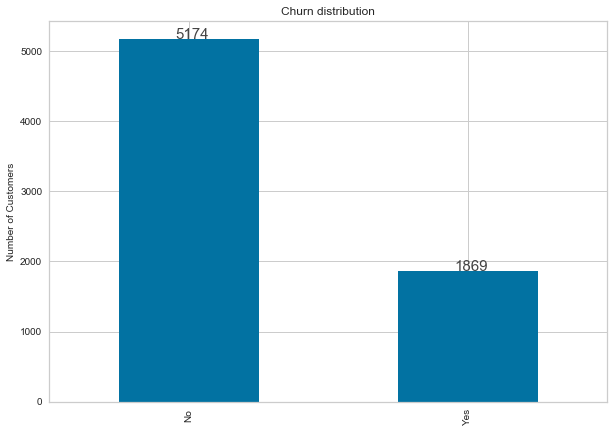

In [24]:
graph = df["Churn"].value_counts().plot(kind='bar', figsize=(10,7))
graph.set_ylabel("Number of Customers", fontsize=10)
plt.title("Churn distribution")

totals = []
for i in graph.patches:
    totals.append(i.get_height())

total = sum(totals)

for i in graph.patches:
    graph.text(i.get_x() +0.2, i.get_height() , \
            str(i.get_height()), fontsize=15,
                color='#444444')
plt.show()


As can be seen from the representation of the response variable, about one quarter of the customers in the dataset actually leave the company.

### Univariate Analysis of numerical Variables
We are now going to display histograms to analyze the absolute frequency of the numerical variables.

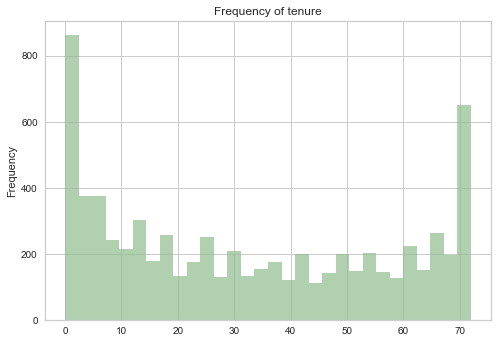

In [25]:
df["tenure"].plot.hist(color='darkseagreen', alpha=0.7, bins=30)
plt.title("Frequency of tenure")
plt.show()

It seems that there are two peaks: one correspondent to low values of `tenure` and the other when it is equal to 72. We suppose this behaviour in the second peak is due to the fact that the dataset represents a snap-shot of the company's customers in a time span of 6 years; for this reason `tenure` equal to 72 represents the clients that leave the company in the last month of the time of evaluation or that remain all the period in the company. 

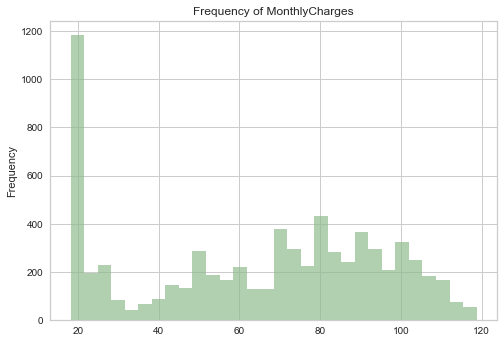

In [26]:
df["MonthlyCharges"].plot.hist(color='darkseagreen', alpha=0.7, bins=30)
plt.title("Frequency of MonthlyCharges")
plt.show()

The majority of customers has a low value of the monthly rate.

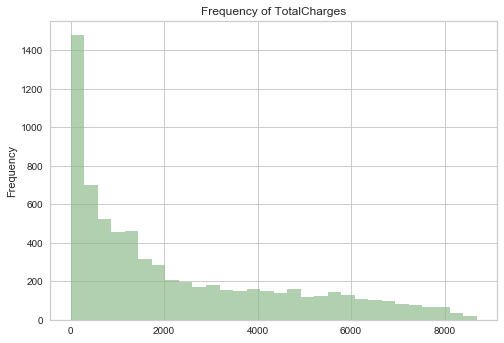

In [27]:
df["TotalCharges"].plot.hist(color='darkseagreen', alpha=0.7, bins=30)
plt.title("Frequency of TotalCharges")
plt.show()

### Boxplots

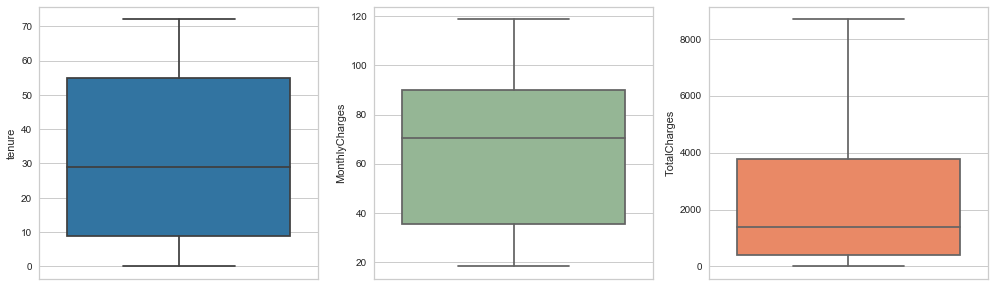

In [28]:
fig, axes = plt.subplots(1, 3, figsize=(17,5))
sns.boxplot(x=df["tenure"], orient="v", color="tab:blue",ax=axes[0])
sns.boxplot(x=df["MonthlyCharges"], orient="v", color="darkseagreen",ax=axes[1])
sns.boxplot(x=df["TotalCharges"], orient="v", color="coral",ax=axes[2])
plt.show()

## EDA: bivariate analysis
In the following section, we will present bivariate graphical representation to better understand how the dataset's variables are structured and to try to extract some insights.

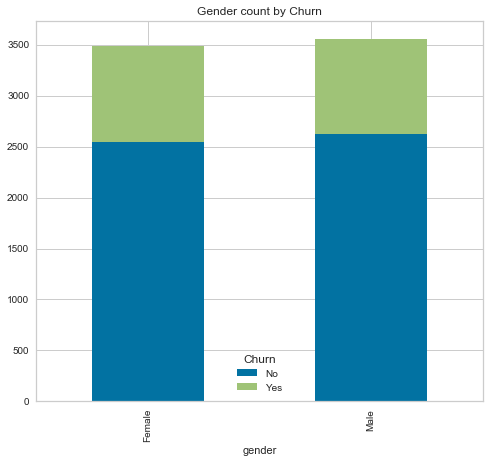

In [29]:
df.groupby(["gender", "Churn"]).size().unstack().plot(kind='bar', stacked=True, figsize=(8,7))
plt.title("Gender count by Churn")
plt.show()

By looking at the variable `gender`, it seems like our dataset is well balanced between Female and Male: moreover, the proportions of Male and Female that leave appear to be homogeneous.

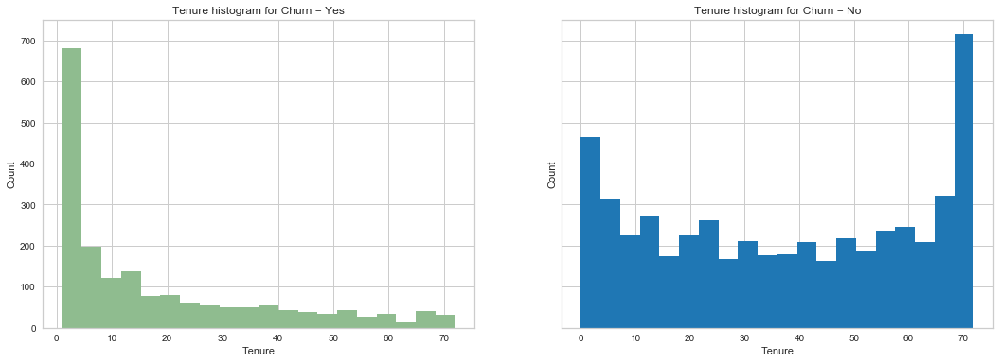

In [30]:
fig, axes = plt.subplots(1, 2, figsize=(18,6), sharey=True)
yes = df.tenure[df["Churn"]=="Yes"]
noyes = df.tenure[df["Churn"]=="No"]
axes[0].hist(yes, bins=20, color='darkseagreen')
axes[0].set_title("Tenure histogram for Churn = Yes")
axes[0].set(xlabel='Tenure', ylabel='Count')
axes[1].hist(noyes, bins=20, color='tab:blue')
axes[1].set_title("Tenure histogram for Churn = No")
axes[1].set(xlabel='Tenure', ylabel='Count')
plt.show()

By considering customers that leave the company, we notice that the majority of them has a low value of `tenure`. Probably this behaviour is linked to the fact that many people frequently change their service provider to take advantages from some offers with low initial tariffs.

On the other hand, there is not a specific pattern in the clients that don't leave the company; we only highlight a peak for high values of `tenure`.

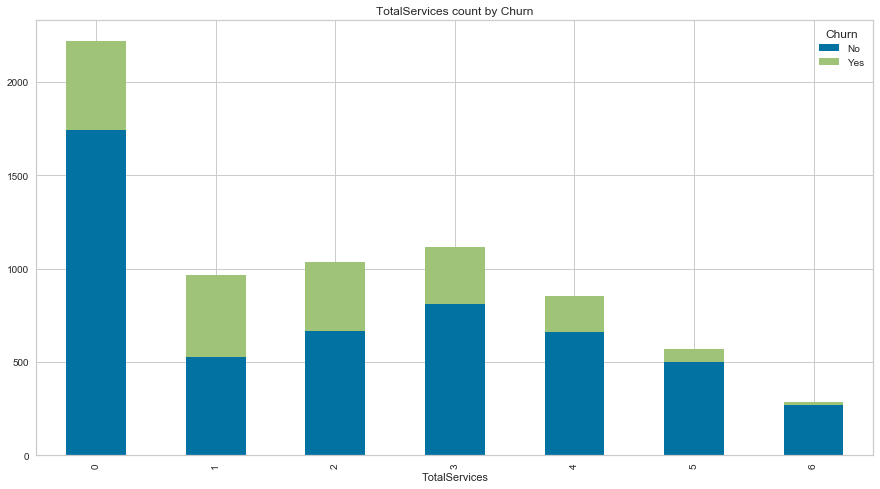

In [31]:
df.groupby(["TotalServices", "Churn"]).size().unstack().plot(kind='bar', stacked=True, figsize=(15,8))
plt.title("TotalServices count by Churn")
plt.show()

By considering the `TotalServices` variable that we have created, we can see that the churn proportions of customers having 0, 1 or 2 services is almost similar, while customers with more than 3 services tend to churn less. 

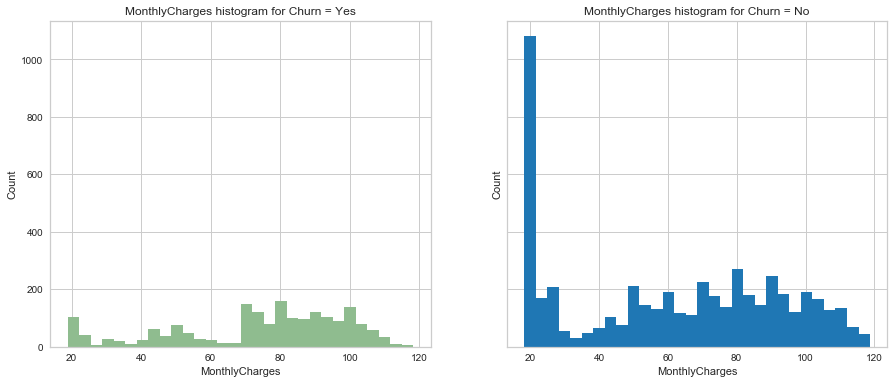

In [32]:
fig, axes = plt.subplots(1, 2, figsize=(15,6), sharey=True)
yes = df.MonthlyCharges[df["Churn"]=="Yes"]
noyes = df.MonthlyCharges[df["Churn"]=="No"]
axes[0].hist(yes, bins=30, color='darkseagreen')
axes[0].set_title("MonthlyCharges histogram for Churn = Yes")
axes[0].set(xlabel='MonthlyCharges', ylabel='Count')
axes[1].hist(noyes, bins=30, color='tab:blue')
axes[1].set_title("MonthlyCharges histogram for Churn = No")
axes[1].set(xlabel='MonthlyCharges', ylabel='Count')
plt.show()

We can see that only difference present is for low value of `MonthlyCharges`: there is a peak only for people that remain as clients.

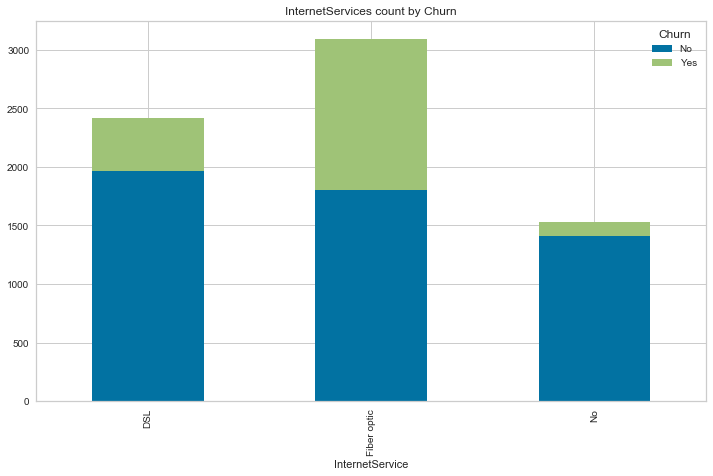

In [33]:
df.groupby(["InternetService", "Churn"]).size().unstack().plot(kind='bar', stacked=True, figsize=(12,7))
plt.title("InternetServices count by Churn")
plt.show()

The proportion of customers that leave is lower for those that don't have any internet service: it may be because they are elder people and because since that they don't have such services maybe they have a lower monthly charge.

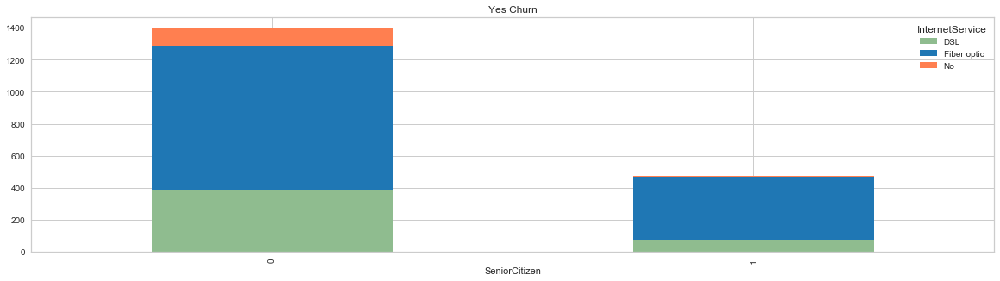

In [34]:
df[df.Churn=='Yes'].groupby(["SeniorCitizen","InternetService"]).size().unstack().plot(kind='bar', stacked=True, figsize=(20,5),color=['darkseagreen','tab:blue',"coral"]) 
plt.title('Yes Churn')
plt.show()

As we have supposed, senior citizens that don't have internet service are likely to remain in the company.

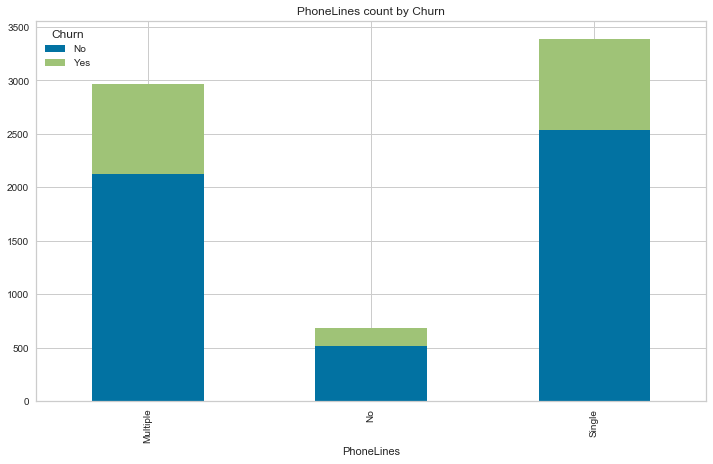

In [35]:
df.groupby(["PhoneLines", "Churn"]).size().unstack().plot(kind='bar', stacked=True, figsize=(12,7)) 
plt.title("PhoneLines count by Churn")
plt.show()

By looking at this plot we can make the same assumption of the previous graph for `InternetService`.

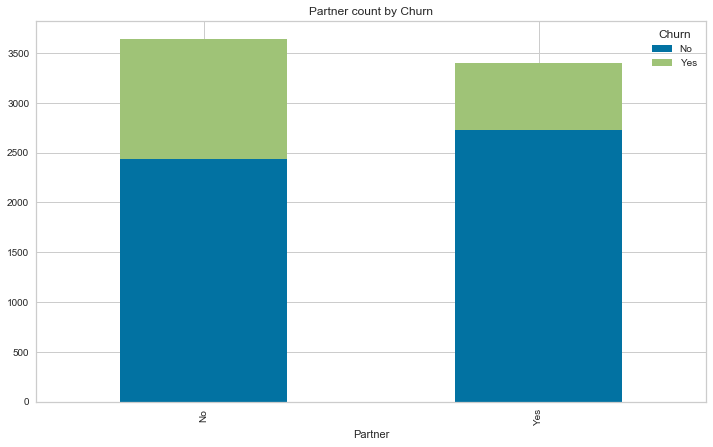

In [36]:
df.groupby(["Partner", "Churn"]).size().unstack().plot(kind='bar', stacked=True, figsize=(12,7))
plt.title("Partner count by Churn")
plt.show()

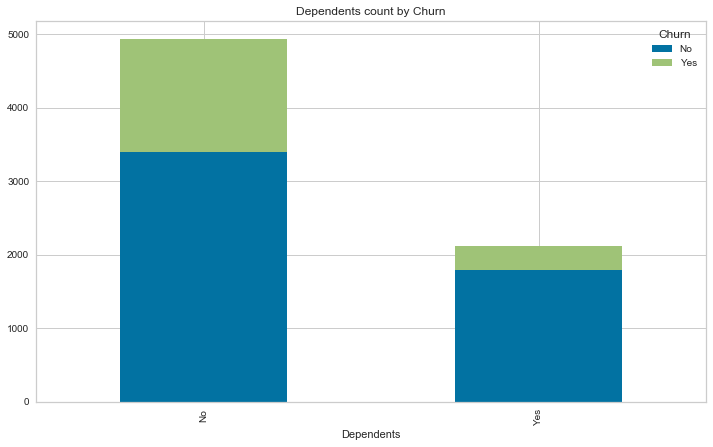

In [37]:
df.groupby(["Dependents", "Churn"]).size().unstack().plot(kind='bar', stacked=True, figsize=(12,7))
plt.title("Dependents count by Churn")
plt.show()

These last two plots give us information regarding the family status of the customers: as can be seen the proportion of who leaves is higher if doesn't have partner and dependents.

# Features selection

## Encoding

In [38]:
df = pd.read_csv('TelcoChurnFinal.csv', dtype={'SeniorCitizen':str})
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,TotalServices
0,7590-VHVEG,Female,0,Yes,No,1,No,DSL,No,Yes,...,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,1
1,5575-GNVDE,Male,0,No,No,34,Single,DSL,Yes,No,...,No,No,No,One year,No,Mailed check,56.95,1889.50,No,2
2,3668-QPYBK,Male,0,No,No,2,Single,DSL,Yes,Yes,...,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,2
3,7795-CFOCW,Male,0,No,No,45,No,DSL,Yes,No,...,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No,3
4,9237-HQITU,Female,0,No,No,2,Single,Fiber optic,No,No,...,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,0


Removing `customerID`

In [39]:
df.drop('customerID', 1, inplace=True)

We use the function `get_dummies` with `drop_first=True` to have n-1 dummies for each variable. This passage is required to use `sklearn` to apply models.
We have decided to use this type of encoding to highlight the presence or not of particular service.

In [40]:
df = pd.get_dummies(df, drop_first=True)
df.columns

Index(['tenure', 'MonthlyCharges', 'TotalCharges', 'TotalServices',
       'gender_Male', 'SeniorCitizen_1', 'Partner_Yes', 'Dependents_Yes',
       'PhoneLines_No', 'PhoneLines_Single', 'InternetService_Fiber optic',
       'InternetService_No', 'OnlineSecurity_Yes', 'OnlineBackup_Yes',
       'DeviceProtection_Yes', 'TechSupport_Yes', 'StreamingTV_Yes',
       'StreamingMovies_Yes', 'Contract_One year', 'Contract_Two year',
       'PaperlessBilling_Yes', 'PaymentMethod_Credit card (automatic)',
       'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check',
       'Churn_Yes'],
      dtype='object')

## Correlation

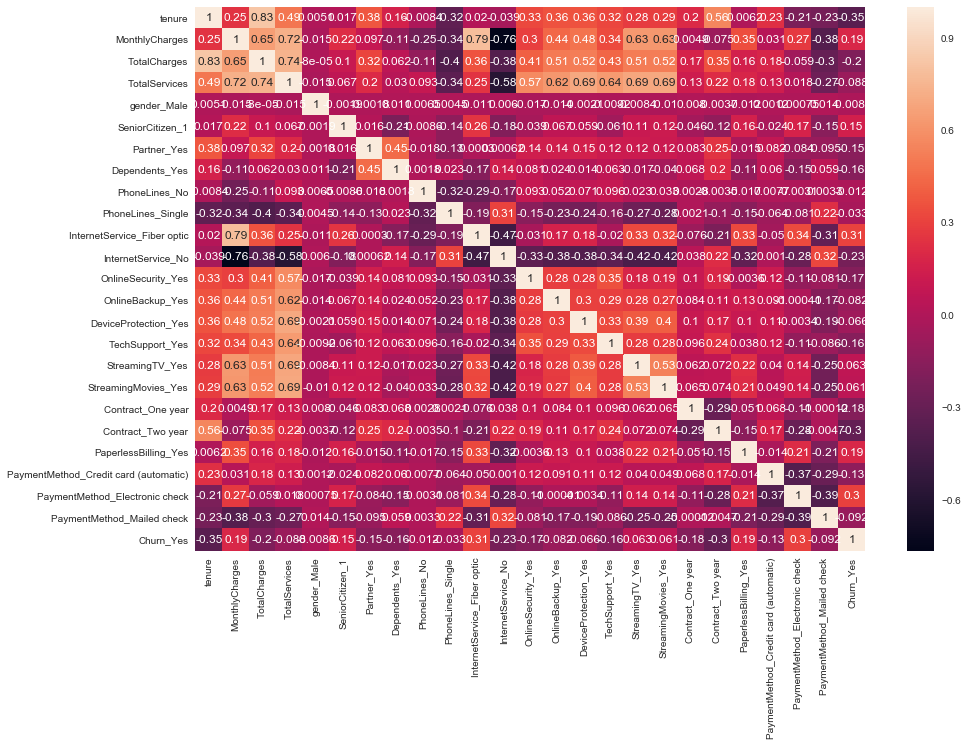

In [41]:
# correlation:
def show_correlations(dataframe, show_chart = True):
    fig = plt.figure(figsize = (15,10))
    corr = dataframe.corr()
    if show_chart == True:
        sns.heatmap(corr, 
                    xticklabels=corr.columns.values,
                    yticklabels=corr.columns.values,
                    annot=True)
    return corr

correlation_df = show_correlations(df,show_chart=True)

# Train/test splitting

In [42]:
df_copy = df.copy()

In [43]:
from sklearn.model_selection import StratifiedShuffleSplit
sss = StratifiedShuffleSplit(test_size=0.25, n_splits=1, random_state=1123)

for train_index, test_index in sss.split(df_copy, df_copy['Churn_Yes']):
    print(len(train_index), len(test_index))
    print(df_copy.loc[train_index, 'Churn_Yes'].mean(), df_copy.loc[test_index, 'Churn_Yes'].mean())
    train = df_copy.loc[train_index]
    test = df_copy.loc[test_index]

5282 1761
0.2654297614539947 0.26519023282226006


We use `StratifiedShuffleSplit` in order to maintain the same proportion (0.265) of the target variable in both train and test datasets.

In [44]:
# this piece of code exclude variables that are too correlated with the others
couples = {}
correlations=train.corr()
drop_c = []
for i, r in correlations.iterrows():
    for j, x in r.iteritems():
        if i != j and np.abs(x) > 0.9 and i not in drop_c and j not in drop_c:
            couples[(i, j)] = (correlations.loc[i, j], correlations.loc[i, 'Churn_Yes'], correlations.loc[j, 'Churn_Yes'])
            drop_c.append(j)



Since we use 0.9 as the cutoff to remove highly correlated variables, we don't drop any variable:

In [45]:
drop_c

[]

The code below divides the target variable in both train and test

In [46]:
X = train.drop('Churn_Yes', 1)
Y = train['Churn_Yes']
X_test = test.drop('Churn_Yes', 1)
y_test = test['Churn_Yes']

The code below is used to drop some highly-correlated variables for the logistic regression. 
This is done because the logistic regression is a parametric model.

In [47]:
X_lr = X.drop(['TotalCharges','OnlineSecurity_Yes', 'OnlineBackup_Yes',
       'DeviceProtection_Yes', 'TechSupport_Yes', 'StreamingTV_Yes',
       'StreamingMovies_Yes'], 1)
X_test_lr = X_test.drop(['TotalCharges','OnlineSecurity_Yes', 'OnlineBackup_Yes',
       'DeviceProtection_Yes', 'TechSupport_Yes', 'StreamingTV_Yes',
       'StreamingMovies_Yes'], 1)

# Machine learning algorithms

In this section we will perform different models. We used a **cross-validation approach** in order to choose the best parameters to train our model: for each model we first set a wider grid of parameters and, as we performe different cross-validations, we restrict the parameters' range and finally train the best model. The models resulting from cross-validation are compared by taking into account test **AUC** and its discrepancy with train AUC.

Then, for the evaluation of the models, we decide to change the threshold by selecting the one that **maximize F1 Score**. 

## Logistic Regression

### Model

In [48]:
lr_model = Pipeline([('scaler', RobustScaler()),
                     ('model', LogisticRegression())])

In [49]:
#model training
lr_model.fit(X_lr, Y)

Pipeline(memory=None,
         steps=[('scaler',
                 RobustScaler(copy=True, quantile_range=(25.0, 75.0),
                              with_centering=True, with_scaling=True)),
                ('model',
                 LogisticRegression(C=1.0, class_weight=None, dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=100,
                                    multi_class='warn', n_jobs=None,
                                    penalty='l2', random_state=None,
                                    solver='warn', tol=0.0001, verbose=0,
                                    warm_start=False))],
         verbose=False)

In [50]:
print('\n'.join([str((x, c)) for (x, c) in zip(X_lr.columns, lr_model.named_steps['model'].coef_[0])]))
#these are the values of the coefficient that we use for the logistic model

('tenure', -1.617390884703909)
('MonthlyCharges', 2.3956398748181282)
('TotalServices', -0.9477656273772695)
('gender_Male', -0.01530010557086204)
('SeniorCitizen_1', 0.21596638739099358)
('Partner_Yes', -0.02168702201174848)
('Dependents_Yes', -0.1893876575920691)
('PhoneLines_No', 1.388170209549613)
('PhoneLines_Single', -0.09159401154698346)
('InternetService_Fiber optic', -0.053608681864135636)
('InternetService_No', 0.3238515817479639)
('Contract_One year', -0.6660550371268221)
('Contract_Two year', -1.2252626133266646)
('PaperlessBilling_Yes', 0.39262410765550143)
('PaymentMethod_Credit card (automatic)', -0.18509150381461403)
('PaymentMethod_Electronic check', 0.3096577684249916)
('PaymentMethod_Mailed check', -0.06932594884907196)


In [51]:
test_probs_tot = lr_model.predict_proba(X_test_lr)


In [52]:
test_preds = lr_model.predict(X_test_lr)
test_probs = [x_lr[1] for x_lr in test_probs_tot]

In [53]:
lr_probs = [y for (x, y) in lr_model.predict_proba(X_lr)]
lr_probs_test = [y for (x, y) in lr_model.predict_proba(X_test_lr)]

We now print the ROC curve and AUC value

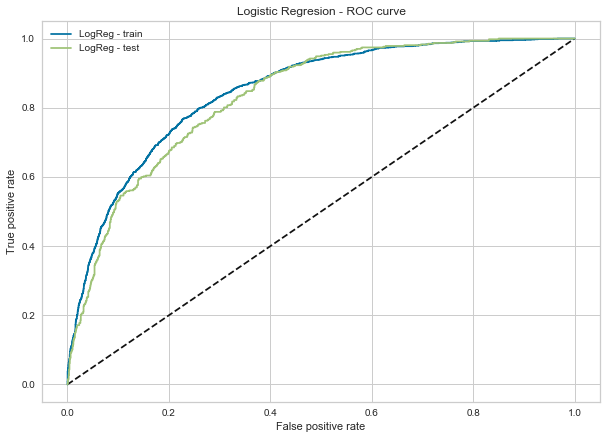

In [54]:
lr_fpr_train, lr_tpr_train, _ = roc_curve(Y, lr_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs_test)

plt.figure(1, figsize=(10, 7))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(lr_fpr_train, lr_tpr_train, label='LogReg - train')
plt.plot(lr_fpr, lr_tpr, label='LogReg - test')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Logistic Regresion - ROC curve')
plt.legend(loc='best')
plt.show()

In [55]:
print('Train set auc: {}'.format(roc_auc_score(Y, lr_probs))) 
print('Test set auc: {}'.format(roc_auc_score(y_test, lr_probs_test)))

Train set auc: 0.8472787402385399
Test set auc: 0.8330823534084176


In [56]:
with open('./models/lr_model.pkl', 'wb') as f:
    pkl.dump(lr_model, f)
    
    
#saving the model

### Evaluation

In [57]:
with open('./models/lr_model.pkl', 'rb') as f:
    lr = pkl.load(f)
lr_preds = lr.predict(X_test_lr.drop(drop_c, 1))
lr_probs_train = [Y for (x, Y) in lr.predict_proba(X_lr.drop(drop_c, 1))]
lr_probs = [Y for (x, Y) in lr.predict_proba(X_test_lr.drop(drop_c, 1))]
lr_auc_train = roc_auc_score(Y, lr_probs_train)
lr_auc = roc_auc_score(y_test, lr_probs)

In [58]:
print(precision_score(y_test, lr_preds))
print(recall_score(y_test, lr_preds))
print(accuracy_score(y_test, lr_preds))
print(f1_score(y_test, lr_preds))

0.6611570247933884
0.5139186295503212
0.8012492901760363
0.5783132530120483


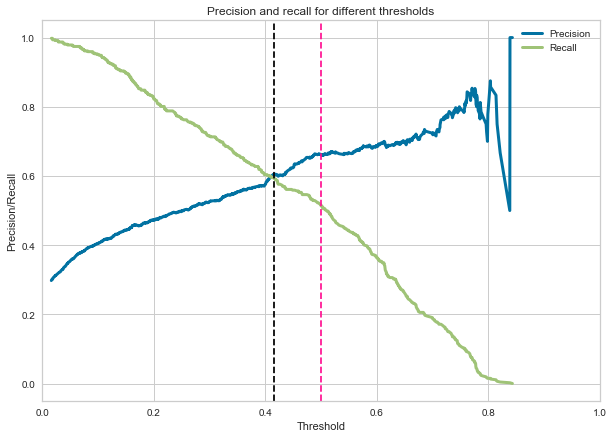

In [59]:
precision, recall, th = precision_recall_curve(y_test, lr_probs)
plt.figure(1, figsize=(10, 7))
plt.plot(th, precision[1:], label="Precision",linewidth=3)
plt.plot(th, recall[1:], label="Recall",linewidth=3)
plt.title('Precision and recall for different thresholds')
plt.xlabel('Threshold')
plt.ylabel('Precision/Recall')
plt.xlim((0,1))
plt.axvline(x=0.415, color = 'black', ls = 'dashed')
plt.axvline(x=0.5, color = 'deeppink', ls = 'dashed')
plt.legend()
plt.show()

In [60]:
pretty_confusion_matrix(y_test, lr_preds)

prediction     
                  0    1
target 0       1171  123
       1        227  240

In [61]:
the_cutoff = 0.3
new_lr_preds = [1 if x >= the_cutoff else 0 for x in lr_probs]

In [62]:
pretty_confusion_matrix(y_test, new_lr_preds)

prediction     
                  0    1
target 0        992  302
       1        133  334

In [63]:
print(precision_score(y_test, new_lr_preds))
print(recall_score(y_test, new_lr_preds))
print(accuracy_score(y_test, new_lr_preds))
print(f1_score(y_test, new_lr_preds))

0.5251572327044025
0.715203426124197
0.7529812606473595
0.6056210335448775


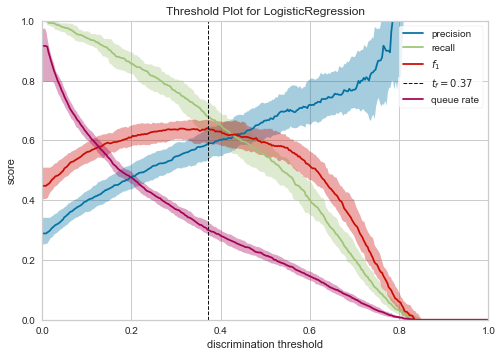

In [64]:
from yellowbrick.classifier import DiscriminationThreshold
visualizer = DiscriminationThreshold(lr)

visualizer.fit(X_lr, Y)        # Fit the data to the visualizer
visualizer.show()

In [112]:
the_cutoff = 0.34
new_lr_preds = [1 if x >= the_cutoff else 0 for x in lr_probs]

In [113]:
pretty_confusion_matrix(y_test, new_lr_preds)

prediction     
                  0    1
target 0       1033  261
       1        151  316

In [114]:
print(precision_score(y_test, new_lr_preds))
print(recall_score(y_test, new_lr_preds))
print(accuracy_score(y_test, new_lr_preds))
print(f1_score(y_test, new_lr_preds))

0.5476603119584056
0.6766595289079229
0.7660420215786485
0.6053639846743295


## Decision tree

### CV

In [68]:
# This is a useful function to print the results

def print_cv(cv):
    print('\n'.join([str((x, y, z)) for (x, y, z) in zip(cv.cv_results_['params'], cv.cv_results_['mean_train_score'], cv.cv_results_['mean_test_score'])]))

In [69]:
r_seed = 1123
dt = DecisionTreeClassifier(random_state=r_seed)

In [70]:
params = {'criterion': ['gini', 'entropy'],
          'max_depth': np.arange(4, 15, 2),
          'min_samples_leaf': [1, 0.01, 0.001]}

cv_tuning = RandomizedSearchCV(dt, params, random_state=r_seed, scoring='roc_auc',
                               return_train_score=True, cv=5, n_iter=20)

cv_tuning.fit(X, Y)

RandomizedSearchCV(cv=5, error_score='raise-deprecating',
                   estimator=DecisionTreeClassifier(class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    presort=False,
                                                    random_state=1123,
                                                    splitter='best')

In [71]:
print_cv(cv_tuning)

({'min_samples_leaf': 1, 'max_depth': 10, 'criterion': 'entropy'}, 0.9328253518446699, 0.7653741233116976)
({'min_samples_leaf': 0.01, 'max_depth': 14, 'criterion': 'gini'}, 0.8684768572669093, 0.818925718130206)
({'min_samples_leaf': 1, 'max_depth': 8, 'criterion': 'gini'}, 0.9131259699614633, 0.7692059381499421)
({'min_samples_leaf': 0.01, 'max_depth': 8, 'criterion': 'entropy'}, 0.8698343651601224, 0.8300580990067716)
({'min_samples_leaf': 0.001, 'max_depth': 6, 'criterion': 'entropy'}, 0.864573321840903, 0.822460134806189)
({'min_samples_leaf': 1, 'max_depth': 4, 'criterion': 'entropy'}, 0.8312312592334885, 0.8217844250074944)
({'min_samples_leaf': 0.001, 'max_depth': 14, 'criterion': 'gini'}, 0.9551976676557086, 0.7383575889832177)
({'min_samples_leaf': 0.01, 'max_depth': 14, 'criterion': 'entropy'}, 0.8722522880170714, 0.8288870210125296)
({'min_samples_leaf': 0.001, 'max_depth': 4, 'criterion': 'entropy'}, 0.831123797430363, 0.821840411470281)
({'min_samples_leaf': 0.01, 'max_de

In [72]:
params = {'criterion': ['gini', 'entropy'],
          'max_depth': [4, 6, 8],
          'min_samples_leaf': [0.1 ,0.01, 0.001]}

cv_tuning = RandomizedSearchCV(dt, params, random_state=r_seed, scoring='roc_auc',
                               return_train_score=True, cv=5, n_iter=20)

cv_tuning.fit(X, Y)

RandomizedSearchCV(cv=5, error_score='raise-deprecating',
                   estimator=DecisionTreeClassifier(class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    presort=False,
                                                    random_state=1123,
                                                    splitter='best')

In [73]:
print_cv(cv_tuning)

({'min_samples_leaf': 0.1, 'max_depth': 4, 'criterion': 'gini'}, 0.8107327732557273, 0.8005350757762909)
({'min_samples_leaf': 0.01, 'max_depth': 4, 'criterion': 'gini'}, 0.8361206103292336, 0.8197419601206158)
({'min_samples_leaf': 0.001, 'max_depth': 4, 'criterion': 'gini'}, 0.8365832495095159, 0.8193549938927485)
({'min_samples_leaf': 0.1, 'max_depth': 6, 'criterion': 'gini'}, 0.8107327732557273, 0.8005350757762909)
({'min_samples_leaf': 0.01, 'max_depth': 6, 'criterion': 'gini'}, 0.8598127971506895, 0.8230605621445141)
({'min_samples_leaf': 0.001, 'max_depth': 6, 'criterion': 'gini'}, 0.8681575324401678, 0.811128562213353)
({'min_samples_leaf': 0.1, 'max_depth': 8, 'criterion': 'gini'}, 0.8107327732557273, 0.8005350757762909)
({'min_samples_leaf': 0.01, 'max_depth': 8, 'criterion': 'gini'}, 0.8678553498525453, 0.8187274196464384)
({'min_samples_leaf': 0.001, 'max_depth': 8, 'criterion': 'gini'}, 0.9046826556741095, 0.7778874379656626)
({'min_samples_leaf': 0.1, 'max_depth': 4, 'cri

In [74]:
dt = DecisionTreeClassifier(random_state=r_seed, criterion='entropy')
params = {'max_depth': [4, 5], 'min_samples_leaf': [0.1, 0.01]}
cv_tuning = GridSearchCV(dt, params, scoring='roc_auc', return_train_score=True, cv=5)

In [75]:
cv_tuning.fit(X, Y)
print('\n'.join([str((x, y, z)) for (x, y, z) in zip(cv_tuning.cv_results_['params'], cv_tuning.cv_results_['mean_train_score'], cv_tuning.cv_results_['mean_test_score'])]))

({'max_depth': 4, 'min_samples_leaf': 0.1}, 0.822092491552087, 0.8152906449321045)
({'max_depth': 4, 'min_samples_leaf': 0.01}, 0.8308776106108006, 0.8218761478030214)
({'max_depth': 5, 'min_samples_leaf': 0.1}, 0.822092491552087, 0.8152906449321045)
({'max_depth': 5, 'min_samples_leaf': 0.01}, 0.8474958329683832, 0.8320424880908798)


### Best Model

In [76]:
dt = DecisionTreeClassifier(random_state=r_seed, criterion='entropy',
                            max_depth=5, min_samples_leaf=0.01)

dt.fit(X, Y)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=0.01, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=1123, splitter='best')

In [77]:
dt_probs = [y for (x, y) in dt.predict_proba(X)]
dt_probs_test = [y for (x, y) in dt.predict_proba(X_test)]

In [78]:
print('Train set auc: {}'.format(roc_auc_score(Y, dt_probs))) # train
print('Test set auc: {}'.format(roc_auc_score(y_test, dt_probs_test))) #test

Train set auc: 0.8462424812859392
Test set auc: 0.8281352908664268


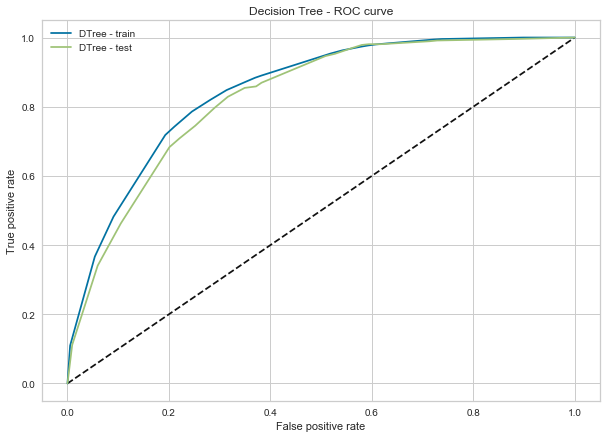

In [79]:
dt_fpr_train, dt_tpr_train, _ = roc_curve(Y, dt_probs)
dt_fpr, dt_tpr, _ = roc_curve(y_test, dt_probs_test)

plt.figure(1, figsize=(10, 7))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(dt_fpr_train, dt_tpr_train, label='DTree - train')
plt.plot(dt_fpr, dt_tpr, label='DTree - test')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Decision Tree - ROC curve')
plt.legend(loc='best')
plt.show()

In [80]:
with open('./models/dt_model.pkl', 'wb') as f:
    pkl.dump(dt, f)

### Evaluation

In [81]:
with open('./models/dt_model.pkl', 'rb') as f:
    dt = pkl.load(f)

dt_preds = dt.predict(X_test)
dt_probs_train = [y for (x, y) in dt.predict_proba(X)]
dt_probs = [y for (x, y) in dt.predict_proba(X_test)]
dt_auc_train = roc_auc_score(Y, dt_probs_train)
dt_auc = roc_auc_score(y_test, dt_probs)

In [82]:
print(precision_score(y_test, dt_preds))
print(recall_score(y_test, dt_preds))
print(accuracy_score(y_test, dt_preds))
print(f1_score(y_test, dt_preds))

0.6136363636363636
0.4625267665952891
0.7802385008517888
0.5274725274725275


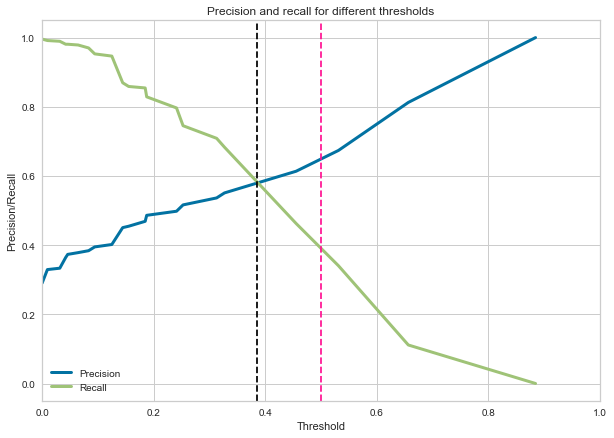

In [83]:
precision, recall, th = precision_recall_curve(y_test, dt_probs)
plt.figure(1, figsize=(10, 7))
plt.plot(th, precision[1:], label="Precision",linewidth=3)
plt.plot(th, recall[1:], label="Recall",linewidth=3)
plt.title('Precision and recall for different thresholds')
plt.xlabel('Threshold')
plt.ylabel('Precision/Recall')
plt.xlim((0,1))
plt.axvline(x=0.385, color = 'black', ls = 'dashed')
plt.axvline(x=0.5, color = 'deeppink', ls = 'dashed')
plt.legend()
plt.show()

In [84]:
pretty_confusion_matrix(y_test, dt_preds)

prediction     
                  0    1
target 0       1158  136
       1        251  216

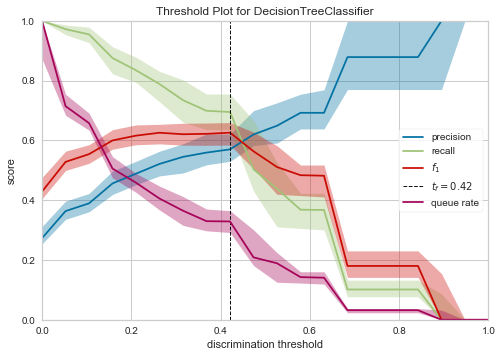

In [85]:
from yellowbrick.classifier import DiscriminationThreshold
visualizer = DiscriminationThreshold(dt)

visualizer.fit(X, Y)        # Fit the data to the visualizer
visualizer.show()

In [103]:
the_cutoff = 0.42
new_dt_preds = [1 if x >= the_cutoff else 0 for x in dt_probs]

In [104]:
pretty_confusion_matrix(y_test, new_dt_preds)

prediction     
                  0    1
target 0       1034  260
       1        148  319

In [105]:
print(precision_score(y_test, new_dt_preds))
print(recall_score(y_test, new_dt_preds))
print(accuracy_score(y_test, new_dt_preds))
print(f1_score(y_test, new_dt_preds))

0.5509499136442142
0.683083511777302
0.768313458262351
0.609942638623327


## Random Forest

### CV

In [89]:
r_seed = 1123
rf = RandomForestClassifier(random_state=r_seed, n_estimators=50)

In [90]:
np.logspace(-1, -3, 3)

array([0.1  , 0.01 , 0.001])

In [91]:
params = {'criterion': ['gini', 'entropy'],
          'max_depth': [2, 3, 4, 5],
          'min_samples_leaf': np.logspace(-1, -3, 3)} #[0.1, 0.01, 0.001]

cv_tuning = RandomizedSearchCV(rf, params, random_state=r_seed, scoring='roc_auc', return_train_score=True, cv=5, n_iter=20)

cv_tuning.fit(X, Y)

RandomizedSearchCV(cv=5, error_score='raise-deprecating',
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    n_estimators=50,
                                                    n_jobs=None,
  

In [92]:
print_cv(cv_tuning)

({'min_samples_leaf': 0.1, 'max_depth': 4, 'criterion': 'entropy'}, 0.8429232058393703, 0.8372593645455667)
({'min_samples_leaf': 0.01, 'max_depth': 2, 'criterion': 'entropy'}, 0.8460509988822891, 0.8409949759759849)
({'min_samples_leaf': 0.01, 'max_depth': 5, 'criterion': 'gini'}, 0.8575901002403518, 0.8451028433913433)
({'min_samples_leaf': 0.01, 'max_depth': 5, 'criterion': 'entropy'}, 0.8579240989993895, 0.845206071591059)
({'min_samples_leaf': 0.1, 'max_depth': 3, 'criterion': 'gini'}, 0.8423342506700291, 0.8360198090724357)
({'min_samples_leaf': 0.01, 'max_depth': 4, 'criterion': 'gini'}, 0.852980788639196, 0.8430940590232081)
({'min_samples_leaf': 0.001, 'max_depth': 5, 'criterion': 'entropy'}, 0.8626605626352088, 0.8452953338545187)
({'min_samples_leaf': 0.01, 'max_depth': 2, 'criterion': 'gini'}, 0.8468797054716249, 0.8410560890247706)
({'min_samples_leaf': 0.01, 'max_depth': 4, 'criterion': 'entropy'}, 0.8527367917263435, 0.8436179633156258)
({'min_samples_leaf': 0.01, 'max_d

In [93]:
rf = RandomForestClassifier(random_state=r_seed, n_estimators=50, criterion='entropy')

params = {'max_depth': [2, 3],
          'min_samples_leaf': [0.01, 0.001, 1],
          'max_features': ['sqrt', 0.2, 0.5]}
cv_tuning = RandomizedSearchCV(rf, params, random_state=r_seed, scoring='roc_auc', return_train_score=True, cv=5)

cv_tuning.fit(X, Y)

RandomizedSearchCV(cv=5, error_score='raise-deprecating',
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    class_weight=None,
                                                    criterion='entropy',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    n_estimators=50,
                                                    n_jobs=None,

In [94]:
print_cv(cv_tuning)

({'min_samples_leaf': 0.001, 'max_features': 0.2, 'max_depth': 3}, 0.8493631045054382, 0.8426634692974962)
({'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 3}, 0.8493967929169708, 0.8427251018812439)
({'min_samples_leaf': 0.001, 'max_features': 0.5, 'max_depth': 2}, 0.8381138768845308, 0.8306979378726491)
({'min_samples_leaf': 0.01, 'max_features': 0.5, 'max_depth': 2}, 0.8381138768845308, 0.8306979378726491)
({'min_samples_leaf': 0.001, 'max_features': 0.2, 'max_depth': 2}, 0.8460490463674499, 0.8409857747484855)
({'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 3}, 0.8493967929169708, 0.8427251018812439)
({'min_samples_leaf': 0.001, 'max_features': 'sqrt', 'max_depth': 2}, 0.8460490463674499, 0.8409857747484855)
({'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 2}, 0.8460490463674499, 0.8409857747484855)
({'min_samples_leaf': 0.01, 'max_features': 'sqrt', 'max_depth': 3}, 0.8489826613383187, 0.8426205399475771)
({'min_samples_leaf': 1, 'max_features'

In [115]:
rf = RandomForestClassifier(random_state=r_seed, n_estimators=50, criterion='entropy', max_depth=3)

params = {'min_samples_leaf': [0.01, 0.001],
          'max_features': [0.1, "sqrt", 0.2, 0.3]}
cv_tuning = GridSearchCV(rf, params, scoring='roc_auc', return_train_score=True, cv=5)

cv_tuning.fit(X, Y)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='entropy', max_depth=3,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=50, n_jobs=None,
                                              oob_score=False,
                                              random_state=1123, verbose=0,
                                              warm_start=False),
             iid='wa

In [116]:
print_cv(cv_tuning)

({'max_features': 0.1, 'min_samples_leaf': 0.01}, 0.8508557809938868, 0.844035002750416)
({'max_features': 0.1, 'min_samples_leaf': 0.001}, 0.8515948184135175, 0.8442798918252574)
({'max_features': 'sqrt', 'min_samples_leaf': 0.01}, 0.8489826613383187, 0.8426205399475771)
({'max_features': 'sqrt', 'min_samples_leaf': 0.001}, 0.8493631045054382, 0.8426634692974962)
({'max_features': 0.2, 'min_samples_leaf': 0.01}, 0.8489826613383187, 0.8426205399475771)
({'max_features': 0.2, 'min_samples_leaf': 0.001}, 0.8493631045054382, 0.8426634692974962)
({'max_features': 0.3, 'min_samples_leaf': 0.01}, 0.8457823416977975, 0.8386476985364475)
({'max_features': 0.3, 'min_samples_leaf': 0.001}, 0.8458468584201192, 0.8388287004390488)


In [117]:
rf = RandomForestClassifier(random_state=r_seed, n_estimators=50,
                            criterion='entropy', max_depth=3,
                            min_samples_leaf=0.01, max_features=0.2,
                            warm_start=True)

# now we tune the number of estimator
for i in range(5):
    rf.fit(X, Y)
    probs = [y for (x, y) in rf.predict_proba(X)]
    probs_test = [y for (x, y) in rf.predict_proba(X_test)]
    print(rf.n_estimators, roc_auc_score(Y, probs), roc_auc_score(y_test, probs_test))
    rf.n_estimators += 50

50 0.8484159227612983 0.8359791030253286
100 0.8496034751533156 0.8367320428000755
150 0.8492399480859449 0.8366617132606762
200 0.8493472138476698 0.8374129982227312
250 0.8495303101607424 0.837472571479634


### Best model

In [118]:
r_seed = 1123
rf = RandomForestClassifier(random_state=r_seed, n_estimators=200,
                            criterion='entropy', max_depth=3,
                            min_samples_leaf=0.01, max_features=0.2,
                            warm_start=True)

rf.fit(X, Y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
                       max_depth=3, max_features=0.2, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=0.01, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=1123,
                       verbose=0, warm_start=True)

In [119]:
rf_probs = [y for (x, y) in rf.predict_proba(X)]
rf_probs_test = [y for (x, y) in rf.predict_proba(X_test)]

print(roc_auc_score(Y, rf_probs))
print(roc_auc_score(y_test, rf_probs_test))

0.8493472138476698
0.8374129982227312


In [120]:
# plot the feauture importances; this score is relative, so the total sums to one
feats = [(x, y) for x, y in zip(X.columns, rf.feature_importances_) if y > 0]
sorted(feats, reverse=True, key=lambda x: x[1])

[('tenure', 0.20458679237493135),
 ('Contract_Two year', 0.17890015206005264),
 ('InternetService_Fiber optic', 0.14455086260412),
 ('PaymentMethod_Electronic check', 0.08678662098686608),
 ('InternetService_No', 0.0702258419717218),
 ('TotalCharges', 0.06792695954411658),
 ('MonthlyCharges', 0.06708786635796232),
 ('Contract_One year', 0.04905796128724063),
 ('PaperlessBilling_Yes', 0.02362609766226046),
 ('TotalServices', 0.02203851838466187),
 ('OnlineSecurity_Yes', 0.021070776237612384),
 ('TechSupport_Yes', 0.015416804579726842),
 ('Dependents_Yes', 0.010642845541197406),
 ('SeniorCitizen_1', 0.006311399580085165),
 ('PaymentMethod_Credit card (automatic)', 0.005683155794081188),
 ('Partner_Yes', 0.004899624516227305),
 ('StreamingTV_Yes', 0.00440245916424795),
 ('OnlineBackup_Yes', 0.004213207756213107),
 ('PaymentMethod_Mailed check', 0.004122792874221177),
 ('StreamingMovies_Yes', 0.0033975415582205887),
 ('DeviceProtection_Yes', 0.0023006199292690994),
 ('PhoneLines_No', 0.001330588307062723),
 ('PhoneLines_Single', 0.001259513994208256),
 ('gender_Male', 0.00016099693369302324)]

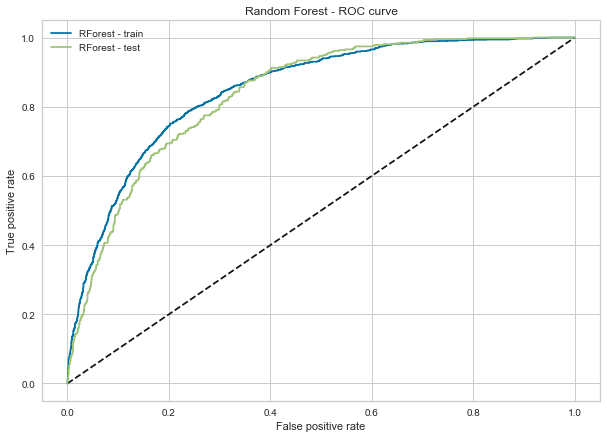

In [121]:
rf_fpr_train, rf_tpr_train, _ = roc_curve(Y, rf_probs)
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs_test)

plt.figure(1, figsize=(10, 7))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(rf_fpr_train, rf_tpr_train, label='RForest - train')
plt.plot(rf_fpr, rf_tpr, label='RForest - test')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Random Forest - ROC curve')
plt.legend(loc='best')
plt.show()

In [122]:
with open('./models/rf_model.pkl', 'wb') as f:
    pkl.dump(rf, f)

### Evaluation

In [123]:
with open('./models/rf_model.pkl', 'rb') as f:
    rf = pkl.load(f)
rf_preds = rf.predict(X_test.drop(drop_c, 1))
rf_probs_train = [Y for (x, Y) in rf.predict_proba(X.drop(drop_c, 1))]
rf_probs = [Y for (x, Y) in rf.predict_proba(X_test.drop(drop_c, 1))]
rf_auc_train = roc_auc_score(Y, rf_probs_train)
rf_auc = roc_auc_score(y_test, rf_probs)

In [124]:
print(precision_score(y_test, rf_preds))
print(recall_score(y_test, rf_preds))
print(accuracy_score(y_test, rf_preds))
print(f1_score(y_test, rf_preds))

0.6949152542372882
0.2633832976445396
0.7739920499716071
0.38198757763975155


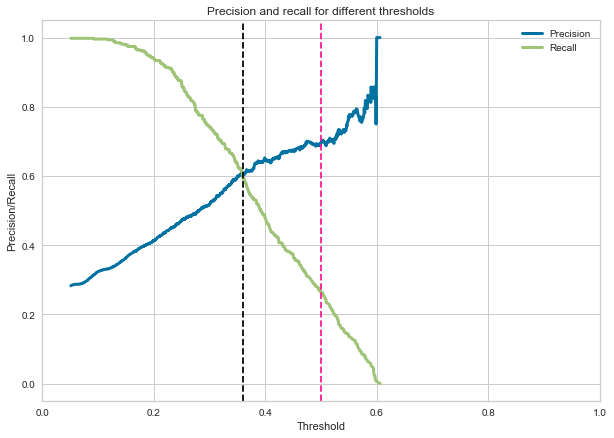

In [125]:
precision, recall, th = precision_recall_curve(y_test, rf_probs)
plt.figure(1, figsize=(10, 7))
plt.plot(th, precision[1:], label="Precision",linewidth=3)
plt.plot(th, recall[1:], label="Recall",linewidth=3)
plt.title('Precision and recall for different thresholds')
plt.xlabel('Threshold')
plt.ylabel('Precision/Recall')
plt.xlim((0,1))
plt.axvline(x=0.36, color = 'black', ls = 'dashed')
plt.axvline(x=0.5, color = 'deeppink', ls = 'dashed')
plt.legend()
plt.show()

In [127]:
pretty_confusion_matrix(y_test, rf_preds)

prediction     
                  0    1
target 0       1240   54
       1        344  123

In [128]:
the_cutoff = 0.36
new_rf_preds = [1 if x >= the_cutoff else 0 for x in rf_probs]

In [129]:
pretty_confusion_matrix(y_test, new_rf_preds)

prediction     
                  0    1
target 0       1111  183
       1        190  277

In [130]:
print(precision_score(y_test, new_rf_preds))
print(recall_score(y_test, new_rf_preds))
print(accuracy_score(y_test, new_rf_preds))
print(f1_score(y_test, new_rf_preds))

0.6021739130434782
0.5931477516059958
0.7881885292447472
0.5976267529665589


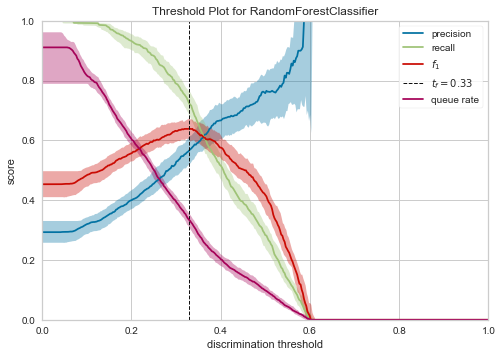

In [131]:
from yellowbrick.classifier import DiscriminationThreshold
visualizer = DiscriminationThreshold(rf)

visualizer.fit(X, Y)        # Fit the data to the visualizer
visualizer.show()

In [132]:
the_cutoff = 0.33
new_rf_preds = [1 if x >= the_cutoff else 0 for x in rf_probs]

In [133]:
pretty_confusion_matrix(y_test, new_rf_preds)

prediction     
                  0    1
target 0       1051  243
       1        150  317

In [134]:
print(precision_score(y_test, new_rf_preds))
print(recall_score(y_test, new_rf_preds))
print(accuracy_score(y_test, new_rf_preds))
print(f1_score(y_test, new_rf_preds))

0.5660714285714286
0.6788008565310493
0.7768313458262351
0.617332035053554


## Boosting

### Gradient Boosting

#### CV

In [140]:
r_seed = 1234
gb = GradientBoostingClassifier(random_state=r_seed, n_estimators=50)
params = {'loss' :['deviance', 'exponential'],
          'learning_rate' : [0.001,0.0001,0.01],
          'subsample' : [1,0.9,0.8],
          'max_features': ['sqrt','log2', 0.2, 0.5,0.8,1],
          'min_samples_split' : np.logspace(-1, -3, 3),
        }

cv_tuning = GridSearchCV(gb, params, scoring='roc_auc', return_train_score=True, cv=5, n_jobs=-1)

cv_tuning.fit(X, Y)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=GradientBoostingClassifier(criterion='friedman_mse',
                                                  init=None, learning_rate=0.1,
                                                  loss='deviance', max_depth=3,
                                                  max_features=None,
                                                  max_leaf_nodes=None,
                                                  min_impurity_decrease=0.0,
                                                  min_impurity_split=None,
                                                  min_samples_leaf=1,
                                                  min_samples_split=2,
                                                  min_weight_fraction_leaf=0.0,
                                                  n_estimators=50,
                                                  n_iter_no_...
                                                  validation_fractio

In [141]:
result_cv = pd.DataFrame([(p,tr,te) for (p,tr,te) in zip(cv_tuning.cv_results_['params'],cv_tuning.cv_results_['mean_train_score'],cv_tuning.cv_results_['mean_test_score']) if te > 0.82]).sort_values(2,ascending=[0])

In [142]:
result_cv

,0,1,2
282,"{'learning_rate': 0.01, 'loss': 'exponential',...",0.851735,0.841723
294,"{'learning_rate': 0.01, 'loss': 'exponential',...",0.851735,0.841723
276,"{'learning_rate': 0.01, 'loss': 'exponential',...",0.851735,0.841723
291,"{'learning_rate': 0.01, 'loss': 'exponential',...",0.851735,0.841723
285,"{'learning_rate': 0.01, 'loss': 'exponential',...",0.851735,0.841723
...,...,...,...
201,"{'learning_rate': 0.0001, 'loss': 'exponential...",0.836123,0.823265
147,"{'learning_rate': 0.0001, 'loss': 'deviance', ...",0.836384,0.823227
150,"{'learning_rate': 0.0001, 'loss': 'deviance', ...",0.836384,0.823227
144,"{'learning_rate': 0.0001, 'loss': 'deviance', ...",0.835579,0.823089


In [143]:
result_cv.reset_index(drop=True,inplace=True)
result_cv.loc[0][0]

{'learning_rate': 0.01,
 'loss': 'exponential',
 'max_features': 'log2',
 'min_samples_split': 0.01,
 'subsample': 1}

{'learning_rate': 0.01,
 'loss': 'exponential',
 'max_features': 'log2',
 'min_samples_split': 0.01,
 'subsample': 1}

In [144]:
gb_best = GradientBoostingClassifier(learning_rate=0.01,
                                     loss='exponential',
                                     max_features = "log2",
                                     min_samples_split = 0.01,
                                     subsample = 1,
                                     random_state=r_seed,
                                     n_estimators=50)

gb_best.fit(X,Y)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.01, loss='exponential', max_depth=3,
                           max_features='log2', max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=0.01,
                           min_weight_fraction_leaf=0.0, n_estimators=50,
                           n_iter_no_change=None, presort='auto',
                           random_state=1234, subsample=1, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [145]:
gb_best.n_estimators = 50
scores = []
numest = []

In [146]:
for i in range(20):
    gb_best.fit(X, Y)
    probs = [y for (x, y) in gb_best.predict_proba(X)]
    probs_test = [y for (x, y) in gb_best.predict_proba(X_test)]
    print(gb_best.n_estimators, roc_auc_score(Y, probs), roc_auc_score(y_test, probs_test))
    print(max(probs_test))   # maximum of the probability distribution. 
    scores.append(roc_auc_score(y_test, probs_test))
    numest.append(gb_best.n_estimators)
    gb_best.n_estimators += 50

50 0.8501949534538288 0.8363348877540551
0.39070813498826995
100 0.8524837492830566 0.8392076425869356
0.5116876639465717
150 0.8538373935614806 0.8399862319584046
0.6104158124627217
200 0.8555949159521744 0.8407093851047001
0.691653507313041
250 0.8574984925805551 0.8421854780257423
0.7498842882358983
300 0.8590643704869333 0.8430799042856338
0.7930583506238503
350 0.8607285983205142 0.843951990574187
0.8273690454292112
400 0.8621224098121977 0.8446387378412638
0.8551738020330104
450 0.8634449865435241 0.8453792665208226
0.8769386306712046
500 0.8646022986308219 0.8460842167275084
0.893668528345118
550 0.8656960968866273 0.8465103309956346
0.9057361385840524
600 0.8664941100342662 0.8467784106516985
0.9129506609357092
650 0.8671592129064517 0.8468355016895639
0.9200871672302404
700 0.867936636910452 0.8469836074254755
0.9256902252020924
750 0.8685846434401517 0.8469298260129936
0.9306310832681728
800 0.8692382568348603 0.8469612674541368
0.9352454515528804
850 0.8699134704472256 0.847

Text(0.5, 1.0, 'Gboost Auc score vs number of estimators')

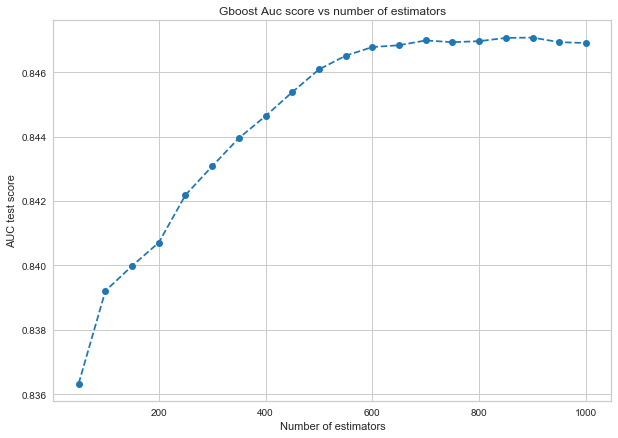

In [147]:
plt.figure(1, figsize=(10, 7))
plt.plot(numest,scores,color = "tab:blue", linestyle='--', marker='o')
plt.xlabel('Number of estimators')
plt.ylabel('AUC test score')
plt.title('Gboost Auc score vs number of estimators')

#### Best model

In [148]:
r_seed = 1234
gb_best = GradientBoostingClassifier(learning_rate=0.01,
                                     loss='exponential',
                                     max_features = "log2",
                                     min_samples_split = 0.01,
                                     subsample = 1,
                                     random_state=r_seed,
                                     n_estimators=900)


gb_best.fit(X,Y)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.01, loss='exponential', max_depth=3,
                           max_features='log2', max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=0.01,
                           min_weight_fraction_leaf=0.0, n_estimators=900,
                           n_iter_no_change=None, presort='auto',
                           random_state=1234, subsample=1, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [149]:
gb_probs = [y for (x, y) in gb_best.predict_proba(X)]
gb_probs_test = [y for (x, y) in gb_best.predict_proba(X_test)]

print(roc_auc_score(Y, gb_probs))
print(roc_auc_score(y_test, gb_probs_test))

0.8705714958012853
0.84707296731083


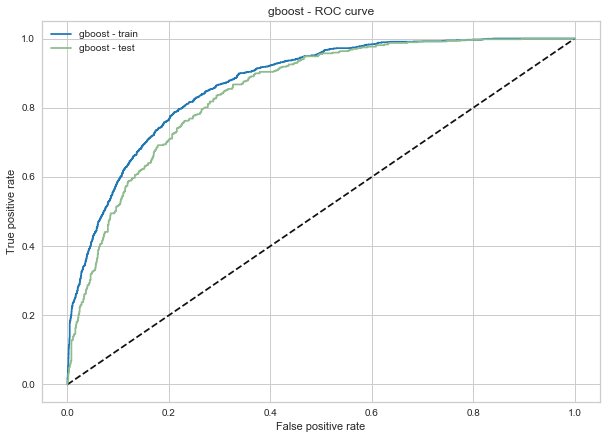

In [150]:
gb_fpr_train, gb_tpr_train, _ = roc_curve(Y, gb_probs)
gb_fpr, gb_tpr, _ = roc_curve(y_test, gb_probs_test)

plt.figure(1, figsize=(10, 7))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(gb_fpr_train, gb_tpr_train, label='gboost - train', color = "tab:blue")
plt.plot(gb_fpr, gb_tpr, label='gboost - test', color = "darkseagreen")
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('gboost - ROC curve')
plt.legend(loc='best')
plt.show()

In [151]:
with open('gb_model.pkl', 'wb') as f:
    pkl.dump(gb_best, f)

#### Evaluation

In [152]:
with open('gb_model.pkl', 'rb') as f:
    gb = pkl.load(f)

In [153]:
gb_preds = gb.predict(X_test.drop(drop_c, 1))
gb_probs_train = [Y for (x, Y) in gb.predict_proba(X.drop(drop_c, 1))]
gb_probs = [Y for (x, Y) in gb.predict_proba(X_test.drop(drop_c, 1))]
gb_auc_train = roc_auc_score(Y, gb_probs_train)
gb_auc = roc_auc_score(y_test, gb_probs)

In [154]:
print(precision_score(y_test, gb_preds))
print(recall_score(y_test, gb_preds))
print(accuracy_score(y_test, gb_preds))
print(f1_score(y_test, gb_preds))

0.6565096952908587
0.5074946466809421
0.7989778534923339
0.5724637681159419


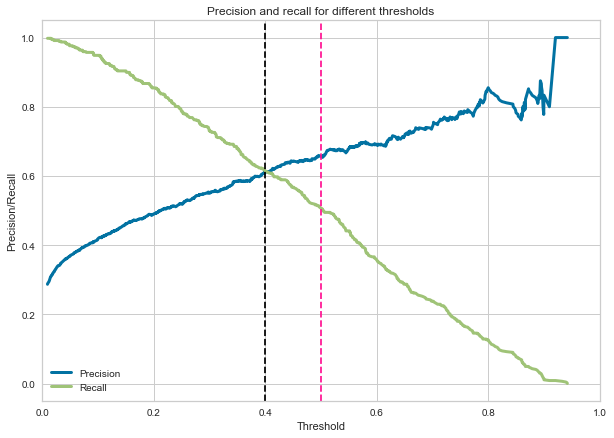

In [155]:
precision, recall, th = precision_recall_curve(y_test, gb_probs)
plt.figure(1, figsize=(10, 7))
plt.plot(th, precision[1:], label="Precision",linewidth=3)
plt.plot(th, recall[1:], label="Recall",linewidth=3)
plt.title('Precision and recall for different thresholds')
plt.xlabel('Threshold')
plt.ylabel('Precision/Recall')
plt.xlim((0,1))
plt.axvline(x=0.4, color = 'black', ls = 'dashed')
plt.axvline(x=0.5, color = 'deeppink', ls = 'dashed')
plt.legend()
plt.show()

In [156]:
pretty_confusion_matrix(y_test, gb_preds)

prediction     
                  0    1
target 0       1170  124
       1        230  237

In [157]:
the_cutoff = 0.4
new_gb_preds = [1 if x >= the_cutoff else 0 for x in gb_probs]

In [158]:
pretty_confusion_matrix(y_test, new_gb_preds)

prediction     
                  0    1
target 0       1112  182
       1        179  288

In [159]:
print(precision_score(y_test, new_gb_preds))
print(recall_score(y_test, new_gb_preds))
print(accuracy_score(y_test, new_gb_preds))
print(f1_score(y_test, new_gb_preds))

0.6127659574468085
0.6167023554603854
0.7950028392958546
0.6147278548559232


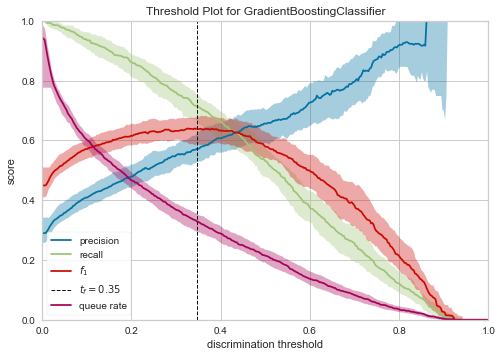

In [160]:
visualizer = DiscriminationThreshold(gb)

visualizer.fit(X, Y)        # Fit the data to the visualizer
visualizer.show()

In [161]:
the_cutoff = 0.35
new_gb_preds = [1 if x >= the_cutoff else 0 for x in gb_probs]

In [162]:
pretty_confusion_matrix(y_test, new_gb_preds)

prediction     
                  0    1
target 0       1068  226
       1        150  317

In [163]:
print(precision_score(y_test, new_gb_preds))
print(recall_score(y_test, new_gb_preds))
print(accuracy_score(y_test, new_gb_preds))
print(f1_score(y_test, new_gb_preds))

0.583793738489871
0.6788008565310493
0.7864849517319704
0.6277227722772277


### Xgboost

#### CV

In [164]:
xg_clas = xgb.XGBClassifier(n_estimators=50)
params = {'objective':['binary:logistic'],
              'learning_rate': [0.001,0.0001,0.01],
              'subsample': [1,0.9,0.8,0.7],
              'max_depth': [3, 4, 5, 6, 7, 8, 9],
              'colsample_bytree': np.arange(0.4,0.8,0.1),
              'min_child_weight': [1, 2, 3]
             }

In [165]:
cv_tuning = GridSearchCV(xg_clas, params, scoring='roc_auc', return_train_score=True, cv=5, n_jobs=5)

cv_tuning.fit(X, Y)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=50, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_la...
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='warn', n_jobs=5,
             param_grid={'colsample_bytree': array([0.4, 0.5, 0.6, 0.7]),
                         'learning_rate': [0.001, 0.0001, 0.01],
                         'max_depth'

In [166]:
result_cv = pd.DataFrame([(p,tr,te) for (p,tr,te) in zip(cv_tuning.cv_results_['params'],cv_tuning.cv_results_['mean_train_score'],cv_tuning.cv_results_['mean_test_score']) if te > 0.82]).sort_values(2,ascending=[0])
result_cv

,0,1,2
466,"{'colsample_bytree': 0.5, 'learning_rate': 0.0...",0.878858,0.845271
212,"{'colsample_bytree': 0.4, 'learning_rate': 0.0...",0.880714,0.845066
224,"{'colsample_bytree': 0.4, 'learning_rate': 0.0...",0.891475,0.845051
204,"{'colsample_bytree': 0.4, 'learning_rate': 0.0...",0.883622,0.845049
208,"{'colsample_bytree': 0.4, 'learning_rate': 0.0...",0.882022,0.844957
...,...,...,...
760,"{'colsample_bytree': 0.7, 'learning_rate': 0.0...",0.843163,0.831266
764,"{'colsample_bytree': 0.7, 'learning_rate': 0.0...",0.843165,0.831178
840,"{'colsample_bytree': 0.7, 'learning_rate': 0.0...",0.842942,0.831144
848,"{'colsample_bytree': 0.7, 'learning_rate': 0.0...",0.842950,0.831142


In [167]:
result_cv.reset_index(drop=True,inplace=True)
result_cv.loc[0][0]

{'colsample_bytree': 0.5,
 'learning_rate': 0.01,
 'max_depth': 6,
 'min_child_weight': 3,
 'objective': 'binary:logistic',
 'subsample': 0.8}

In [168]:
with open('xgb_cv_tuning.pkl', 'wb') as f:
    pkl.dump(cv_tuning, f)

In [169]:
xgb_best = xgb.XGBClassifier(objective = "binary:logistic",
              learning_rate=0.01 ,
              subsample=0.8 ,
              max_depth=6 ,
              colsample_bytree=0.5 ,
              min_child_weight =3 ,
             n_estimators=50)

xgb_best.fit(X,Y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.5, gamma=0,
              learning_rate=0.01, max_delta_step=0, max_depth=6,
              min_child_weight=3, missing=None, n_estimators=50, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=0.8, verbosity=1)

In [170]:
    xgb_best.n_estimators = 50
    scores = []
    numest = []

In [171]:
for i in range(20):
    xgb_best.fit(X, Y)
    probs = [y for (x, y) in xgb_best.predict_proba(X)]
    probs_test = [y for (x, y) in xgb_best.predict_proba(X_test)]
    print(xgb_best.n_estimators, roc_auc_score(Y, probs), roc_auc_score(y_test, probs_test))
    print(max(probs_test))   # maximum of the probability distribution. 
    scores.append(roc_auc_score(y_test, probs_test))
    numest.append(xgb_best.n_estimators)
    xgb_best.n_estimators += 50

50 0.8759761460064415 0.8392862461897939
0.6260454
100 0.8808302204509021 0.8414333656573413
0.7211058
150 0.8841584003706047 0.8432048426438612
0.7882585
200 0.8874682890421637 0.843651642070634
0.83631706
250 0.8910072319367031 0.8440835481831811
0.8702296
300 0.8942029611600512 0.8444616728832463
0.8933378
350 0.8974267247084431 0.8446221897143462
0.9103309
400 0.9002439445857906 0.8448555183038833
0.9226357
450 0.9033370957542245 0.8444898046990061
0.9318312
500 0.9059735172139948 0.8442978464267629
0.9376562
550 0.9085652675853346 0.8441919384144909
0.94194925
600 0.9111549038928188 0.8438278796223054
0.94640625
650 0.913507213553539 0.843846082561915
0.95054746
700 0.9156777137226642 0.843452237141278
0.952789
750 0.9182020897980794 0.8432511773992301
0.9535443
800 0.9203395002720709 0.8429830977431666
0.9555884
850 0.9227315175669514 0.8428126520359159
0.95642656
900 0.9249957718722883 0.842506511687942
0.9578294
950 0.9268131314616822 0.8422582897841793
0.9593685
1000 0.9285189

Text(0.5, 1.0, 'XGboost Auc score vs number of estimators')

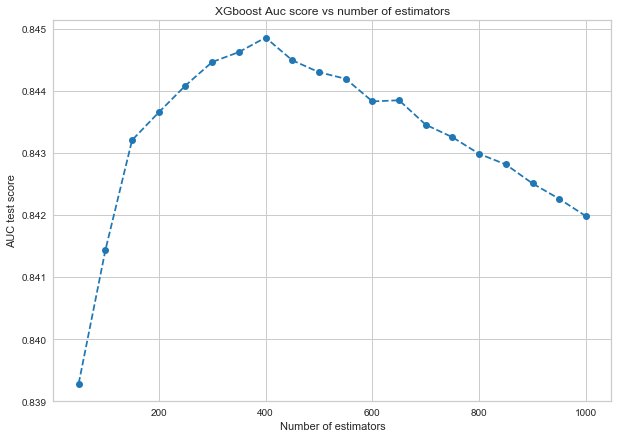

In [172]:
plt.figure(1, figsize=(10, 7))
plt.plot(numest,scores,color = "tab:blue", linestyle='--', marker='o')
plt.xlabel('Number of estimators')
plt.ylabel('AUC test score')
plt.title('XGboost Auc score vs number of estimators')

Final Model

#### Best model

In [173]:
xg_final =  xgb.XGBClassifier(objective = "binary:logistic",
              learning_rate=0.01 ,
              subsample=0.8 ,
              max_depth=6 ,
              colsample_bytree=0.5 ,
              min_child_weight =3 ,
             n_estimators=450)
xg_final.fit(X,Y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.5, gamma=0,
              learning_rate=0.01, max_delta_step=0, max_depth=6,
              min_child_weight=3, missing=None, n_estimators=400, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=0.8, verbosity=1)

In [174]:
with open('xgb_final.pkl', 'wb') as f:
    pkl.dump(xg_final, f)

In [175]:
xgb_probs = [y for (x, y) in xg_final.predict_proba(X)]
xgb_probs_test = [y for (x, y) in xg_final.predict_proba(X_test)]

print(roc_auc_score(Y, xgb_probs))
print(roc_auc_score(y_test, xgb_probs_test))

0.9002439445857906
0.8448555183038833


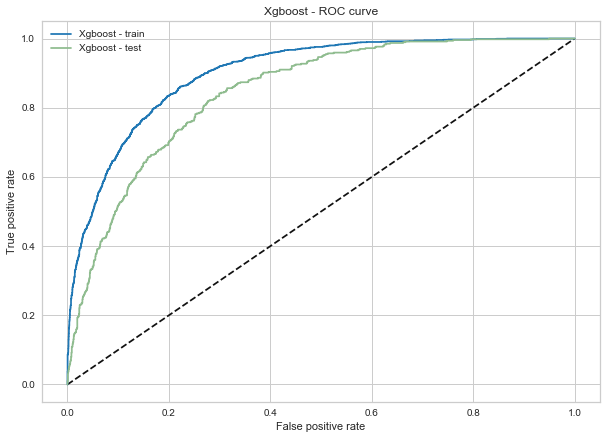

In [176]:
xgb_fpr_train, xgb_tpr_train, _ = roc_curve(Y, xgb_probs)
xgb_fpr, xgb_tpr, _ = roc_curve(y_test, xgb_probs_test)

plt.figure(1, figsize=(10, 7))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(xgb_fpr_train, xgb_tpr_train, label='Xgboost - train', color = "tab:blue")
plt.plot(xgb_fpr, xgb_tpr, label='Xgboost - test', color = "darkseagreen")
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Xgboost - ROC curve')
plt.legend(loc='best')
plt.show()

#### Evaluation

In [177]:
with open('xgb_final.pkl', 'rb') as f:
    xgb = pkl.load(f)
xgb_preds = xgb.predict(X_test.drop(drop_c, 1))
xgb_probs_train = [Y for (x, Y) in xgb.predict_proba(X.drop(drop_c, 1))]
xgb_probs = [Y for (x, Y) in xgb.predict_proba(X_test.drop(drop_c, 1))]
xgb_auc_train = roc_auc_score(Y, xgb_probs_train)
xgb_auc = roc_auc_score(y_test, xgb_probs)

In [178]:
print(precision_score(y_test, xgb_preds))
print(recall_score(y_test, xgb_preds))
print(accuracy_score(y_test, xgb_preds))
print(f1_score(y_test, xgb_preds))

0.6589595375722543
0.48822269807280516
0.797274275979557
0.5608856088560886


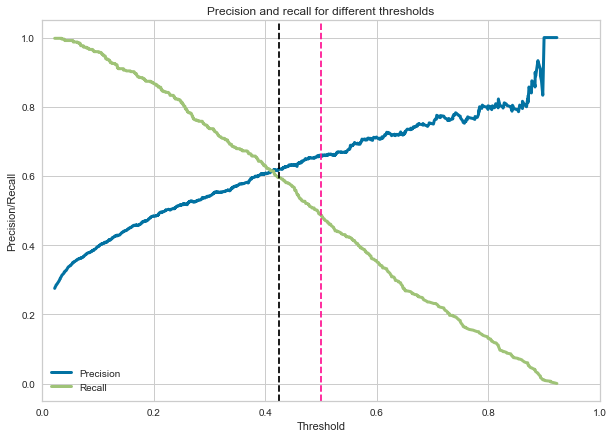

In [179]:
precision, recall, th = precision_recall_curve(y_test, xgb_probs)
plt.figure(1, figsize=(10, 7))
plt.plot(th, precision[1:], label="Precision",linewidth=3)
plt.plot(th, recall[1:], label="Recall",linewidth=3)
plt.title('Precision and recall for different thresholds')
plt.xlabel('Threshold')
plt.ylabel('Precision/Recall')
plt.xlim((0,1))
plt.axvline(x=0.425, color = 'black', ls = 'dashed')
plt.axvline(x=0.5, color = 'deeppink', ls = 'dashed')
plt.legend()
plt.show()

In [180]:
def pretty_confusion_matrix(y, preds):
    return pd.DataFrame(confusion_matrix(y, preds),
                        columns=pd.MultiIndex(levels=[['prediction'], ['0', '1']], codes=[[0, 0], [0, 1]]),
                        index=pd.MultiIndex(levels=[['target'], ['0', '1']], codes=[[0, 0], [0, 1]]))

In [181]:
pretty_confusion_matrix(y_test, xgb_preds)

prediction     
                  0    1
target 0       1176  118
       1        239  228

In [182]:
the_cutoff = 0.425
new_xgb_preds = [1 if x >= the_cutoff else 0 for x in xgb_probs]

In [183]:
pretty_confusion_matrix(y_test, new_xgb_preds)

prediction     
                  0    1
target 0       1123  171
       1        189  278

In [184]:
print(precision_score(y_test, new_xgb_preds))
print(recall_score(y_test, new_xgb_preds))
print(accuracy_score(y_test, new_xgb_preds))
print(f1_score(y_test, new_xgb_preds))

0.6191536748329621
0.5952890792291221
0.7955706984667802
0.6069868995633187


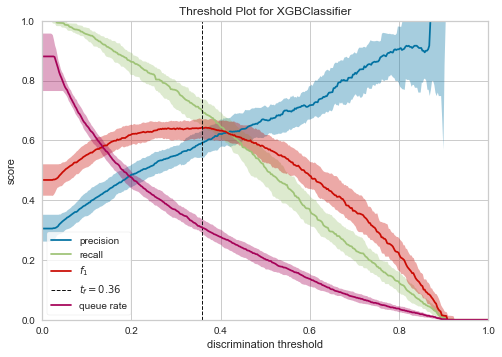

In [185]:
from yellowbrick.classifier import DiscriminationThreshold
visualizer = DiscriminationThreshold(xgb)

visualizer.fit(X, Y)        # Fit the data to the visualizer
visualizer.show()

In [189]:
the_cutoff = 0.36
new_xgb_preds = [1 if x >= the_cutoff else 0 for x in xgb_probs]

In [190]:
pretty_confusion_matrix(y_test, new_xgb_preds)

prediction     
                  0    1
target 0       1064  230
       1        153  314

In [191]:
print(precision_score(y_test, new_xgb_preds))
print(recall_score(y_test, new_xgb_preds))
print(accuracy_score(y_test, new_xgb_preds))
print(f1_score(y_test, new_xgb_preds))

0.5772058823529411
0.6723768736616702
0.7825099375354913
0.6211671612265084


### We use now a subset of the feature space, selected according to the "Importance Table" of Xgboost:

In [192]:
from xgboost import plot_importance

In [193]:
import xgboost as xgb

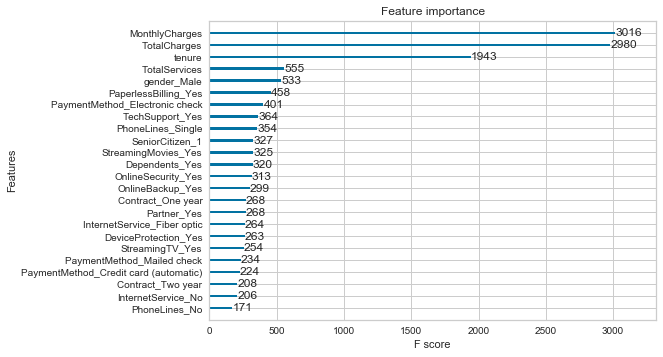

In [194]:
xgb.plot_importance(xg_final)

In [195]:
tuneX = X.copy()
tuneX_test = X_test.copy()

In [196]:
tuneX.drop(['DeviceProtection_Yes', 'StreamingTV_Yes',"OnlineBackup_Yes","StreamingMovies_Yes","TechSupport_Yes","OnlineSecurity_Yes"], axis=1, inplace=True)
tuneX_test.drop(['DeviceProtection_Yes', 'StreamingTV_Yes',"OnlineBackup_Yes","StreamingMovies_Yes","TechSupport_Yes","OnlineSecurity_Yes"], axis=1, inplace=True)

In [197]:
xgb_best = xgb.XGBClassifier(objective = "binary:logistic",
              learning_rate=0.01 ,
              subsample=0.7 ,
              max_depth=6 ,
              colsample_bytree=0.7 ,
              min_child_weight =3 ,
             n_estimators=50)

xgb_best.fit(tuneX,Y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, gamma=0,
              learning_rate=0.01, max_delta_step=0, max_depth=6,
              min_child_weight=3, missing=None, n_estimators=50, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=0.7, verbosity=1)

In [198]:
xgb_best.n_estimators = 50
scores = []
numest = []

In [199]:
for i in range(20):
    xgb_best.fit(tuneX, Y)
    probs = [y for (x, y) in xgb_best.predict_proba(tuneX)]
    probs_test = [y for (x, y) in xgb_best.predict_proba(tuneX_test)]
    print(xgb_best.n_estimators, roc_auc_score(Y, probs), roc_auc_score(y_test, probs_test))
    print(max(probs_test))   # maximum of the probability distribution. 
    scores.append(roc_auc_score(y_test, probs_test))
    numest.append(xgb_best.n_estimators)
    xgb_best.n_estimators += 50

50 0.8737826668823624 0.8376405349678471
0.6409373
100 0.8774533251466976 0.8394012556718705
0.73881507
150 0.8807162448343309 0.8403684936901993
0.8063227
200 0.8841369839845875 0.8410775809286147
0.85457796
250 0.8873803256026002 0.8417486074751198
0.88806456
300 0.8905161257114285 0.8416791053420662
0.90633166
350 0.8936067032369075 0.8418445866112414
0.9171412
400 0.8969801057399591 0.842101082578463
0.92404735
450 0.8998245326999721 0.8420315804454095
0.9291315
500 0.9023940394429167 0.8417800489162631
0.9354083
550 0.9046827433563245 0.841733714160894
0.94065195
600 0.9076030008676853 0.8416410446501561
0.9451988
650 0.9102573459123197 0.8413762746194758
0.947883
700 0.9125138792887921 0.8412786406706626
0.95087284
750 0.9148305256114241 0.8408467345581153
0.95308924
800 0.9168361287998 0.8406216800320372
0.95708144
850 0.9190101217700781 0.8403469811252063
0.9579381
900 0.9209844735797168 0.840396625505959
0.959669
950 0.922932537464888 0.8401814998560313
0.96048915
1000 0.92482

Text(0.5, 1.0, 'XGboost Auc score vs number of estimators')

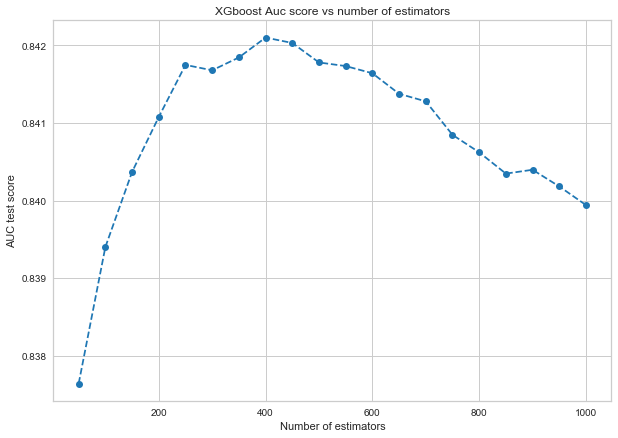

In [200]:
plt.figure(1, figsize=(10, 7))
plt.plot(numest,scores,color = "tab:blue", linestyle='--', marker='o')
plt.xlabel('Number of estimators')
plt.ylabel('AUC test score')
plt.title('XGboost Auc score vs number of estimators')

There is no difference in performance so we decided to keep all the variables, since in this case we don't have a memory space constraint and the fitting of the model is similar.

## SVM

### CV

In [510]:
r_seed = 1
dsvm = svm.SVC(random_state=r_seed)

In [511]:
C_range = np.logspace(1,4 , 7)

params = {'C': C_range,
          'kernel': [ 'linear','sigmoid','rbf'],
          'tol' : [0.005,0.01,0.002,0.02]}

cv_tuning = RandomizedSearchCV(dsvm, params, random_state=r_seed, scoring='roc_auc',
                               return_train_score=True, cv=5, n_iter=20, n_jobs=-1)

cv_tuning.fit(X, Y)

RandomizedSearchCV(cv=5, error_score='raise-deprecating',
                   estimator=SVC(C=1.0, cache_size=200, class_weight=None,
                                 coef0=0.0, decision_function_shape='ovr',
                                 degree=3, gamma='auto_deprecated',
                                 kernel='rbf', max_iter=-1, probability=False,
                                 random_state=1, shrinking=True, tol=0.001,
                                 verbose=False),
                   iid='warn', n_iter=20, n_jobs=-1,
                   param_distributions={'C': array([   10.        ,    31.6227766 ,   100.        ,   316.22776602,
        1000.        ,  3162.27766017, 10000.        ]),
                                        'kernel': ['linear', 'sigmoid', 'rbf'],
                                        'tol': [0.005, 0.01, 0.002, 0.02]},
                   pre_dispatch='2*n_jobs', random_state=1, refit=True,
                   return_train_score=True, scoring='roc_auc', ver

In [512]:
print_cv(cv_tuning)

({'tol': 0.002, 'kernel': 'rbf', 'C': 10.0}, 0.9928435643246193, 0.6909850907836288)
({'tol': 0.02, 'kernel': 'sigmoid', 'C': 3162.2776601683795}, 0.49935567010309284, 0.49935579208906344)
({'tol': 0.02, 'kernel': 'rbf', 'C': 1000.0}, 0.9941895376572727, 0.6825100087684235)
({'tol': 0.01, 'kernel': 'rbf', 'C': 100.0}, 0.9932683526415607, 0.6861459290093219)
({'tol': 0.02, 'kernel': 'rbf', 'C': 10000.0}, 0.9958141150423667, 0.6801055332173451)
({'tol': 0.01, 'kernel': 'sigmoid', 'C': 10000.0}, 0.4995167525773196, 0.4994846092740566)
({'tol': 0.002, 'kernel': 'rbf', 'C': 100.0}, 0.9933142405311729, 0.6861441104198976)
({'tol': 0.002, 'kernel': 'linear', 'C': 316.22776601683796}, 0.7933901917908288, 0.7913219478166507)
({'tol': 0.02, 'kernel': 'rbf', 'C': 316.22776601683796}, 0.9935196342420969, 0.6852042489135233)
({'tol': 0.005, 'kernel': 'rbf', 'C': 1000.0}, 0.9944578037394253, 0.6825107917360271)
({'tol': 0.002, 'kernel': 'sigmoid', 'C': 10000.0}, 0.4995167525773196, 0.499484609274056

### Best model

In [513]:
r_seed = 1
dsvm = svm.SVC(random_state=r_seed,tol=0.005, kernel='linear', C= 17.78279410038923,probability=True)
dsvm.fit(X, Y)

SVC(C=17.78279410038923, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='linear', max_iter=-1, probability=True, random_state=1,
    shrinking=True, tol=0.005, verbose=False)

In [514]:
dsvm_probs = [y for (x, y) in dsvm.predict_proba(X)]
dsvm_probs_test = [y for (x, y) in dsvm.predict_proba(X_test)]

print(roc_auc_score(Y, dsvm_probs))
print(roc_auc_score(y_test, dsvm_probs_test))

0.8014065877906377
0.7924906254861013


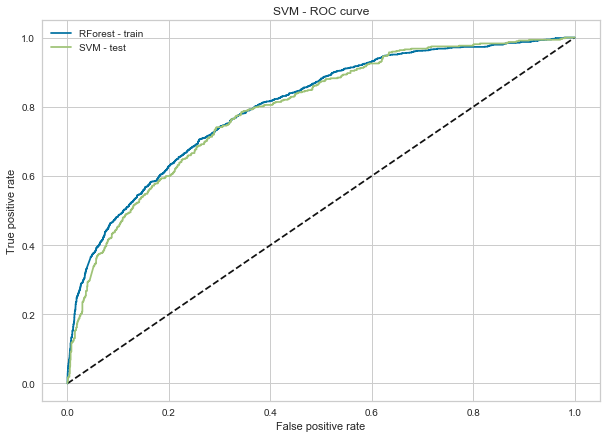

In [515]:
dsvm_fpr_train, dsvm_tpr_train, _ = roc_curve(Y, dsvm_probs)
dsvm_fpr, dsvm_tpr, _ = roc_curve(y_test, dsvm_probs_test)

plt.figure(1, figsize=(10, 7))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(dsvm_fpr_train, dsvm_tpr_train, label='RForest - train')
plt.plot(dsvm_fpr, dsvm_tpr, label='SVM - test')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('SVM - ROC curve')
plt.legend(loc='best')
plt.show()

In [516]:
with open('./models/svm_final.pkl', 'wb') as f:
    pkl.dump(dsvm, f)

### Evaluation

In [517]:
with open('./models/svm_final.pkl', 'rb') as f:
    svm = pkl.load(f)
svm_preds = svm.predict(X_test.drop(drop_c, 1))
svm_probs_train = [Y for (x, Y) in svm.predict_proba(X.drop(drop_c, 1))]
svm_probs = [Y for (x, Y) in svm.predict_proba(X_test.drop(drop_c, 1))]
svm_auc_train = roc_auc_score(Y, svm_probs_train)
svm_auc = roc_auc_score(y_test, svm_probs)

In [518]:
print(precision_score(y_test, svm_preds))
print(recall_score(y_test, svm_preds))
print(accuracy_score(y_test, svm_preds))
print(f1_score(y_test, svm_preds))

0.6366559485530546
0.42398286937901497
0.7830777967064169
0.5089974293059125


For SVM we decide to take into account the following graph (differently from other models) due to computational complexity reasons.

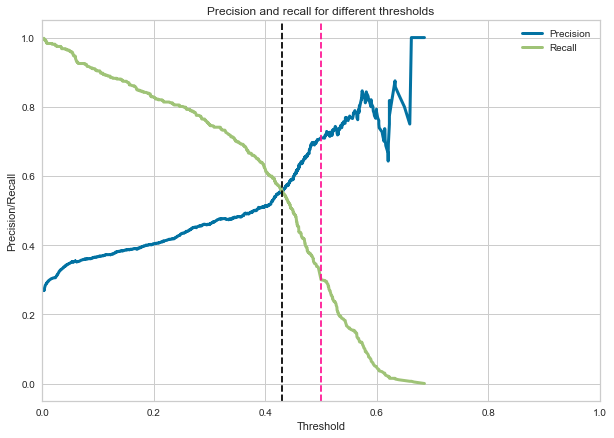

In [519]:
precision, recall, th = precision_recall_curve(y_test, svm_probs)
plt.figure(1, figsize=(10, 7))
plt.plot(th, precision[1:], label="Precision",linewidth=3)
plt.plot(th, recall[1:], label="Recall",linewidth=3)
plt.title('Precision and recall for different thresholds')
plt.xlabel('Threshold')
plt.ylabel('Precision/Recall')
plt.xlim((0,1))
plt.axvline(x=0.43, color = 'black', ls = 'dashed')
plt.axvline(x=0.5, color = 'deeppink', ls = 'dashed')
plt.legend()
plt.show()

In [520]:
def pretty_confusion_matrix(y, preds):
    return pd.DataFrame(confusion_matrix(y, preds),
                        columns=pd.MultiIndex(levels=[['prediction'], ['0', '1']], codes=[[0, 0], [0, 1]]),
                        index=pd.MultiIndex(levels=[['target'], ['0', '1']], codes=[[0, 0], [0, 1]]))

In [521]:
pretty_confusion_matrix(y_test, svm_preds)

prediction     
                  0    1
target 0       1181  113
       1        269  198

In [522]:
the_cutoff = 0.43
new_svm_preds = [1 if x >= the_cutoff else 0 for x in svm_probs]

In [523]:
pretty_confusion_matrix(y_test, new_svm_preds)

prediction     
                  0    1
target 0       1087  207
       1        207  260

In [524]:
print(precision_score(y_test, new_svm_preds))
print(recall_score(y_test, new_svm_preds))
print(accuracy_score(y_test, new_svm_preds))
print(f1_score(y_test, new_svm_preds))

0.556745182012848
0.556745182012848
0.7649063032367973
0.556745182012848


In [525]:
the_cutoff = 0.4
new_svm_preds = [1 if x >= the_cutoff else 0 for x in svm_probs]

In [526]:
pretty_confusion_matrix(y_test, new_svm_preds)

prediction     
                  0    1
target 0       1020  274
       1        177  290

In [527]:
print(precision_score(y_test, new_svm_preds))
print(recall_score(y_test, new_svm_preds))
print(accuracy_score(y_test, new_svm_preds))
print(f1_score(y_test, new_svm_preds))

0.5141843971631206
0.6209850107066381
0.7438955139125497
0.562560620756547


# Model Comparison and Ensemble

In [201]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, roc_curve, roc_auc_score

In [202]:
from sklearn.ensemble import VotingClassifier # for classification: we put together the already estimated
# models and it will return a new probability distribution.

In [203]:
with open('./models/lr_model.pkl', 'rb') as f:
    lr = pkl.load(f)
    
with open('./models/dt_model.pkl', 'rb') as f:
    dt = pkl.load(f)    

with open('./models/rf_model.pkl', 'rb') as f:
    rf = pkl.load(f)

with open('gb_model.pkl', 'rb') as f:
    gb = pkl.load(f)

with open('xgb_final.pkl', 'rb') as f:
    xgb = pkl.load(f)

with open('./models/svm_final.pkl', 'rb') as f:
    svm = pkl.load(f)   

## Model comparison
In this section, we will provide a comparison between the models we have fitted by discussing differences and similarities among them.

We display the results of different metrics for each model always considering the **default threshold of 0.5**.

In [204]:
lr_preds = lr.predict(X_test_lr.drop(drop_c, 1))
lr_probs_train = [y for (x, y) in lr.predict_proba(X_lr.drop(drop_c, 1))]
lr_probs = [y for (x, y) in lr.predict_proba(X_test_lr.drop(drop_c, 1))]
lr_auc_train = roc_auc_score(Y, lr_probs_train)
lr_auc = roc_auc_score(y_test, lr_probs)

In [205]:
dt_preds = dt.predict(X_test)
dt_probs_train = [y for (x, y) in dt.predict_proba(X)]
dt_probs = [y for (x, y) in dt.predict_proba(X_test)]
dt_auc_train = roc_auc_score(Y, dt_probs_train)
dt_auc = roc_auc_score(y_test, dt_probs)

rf_preds = rf.predict(X_test)
rf_probs_train = [y for (x, y) in rf.predict_proba(X)]
rf_probs = [y for (x, y) in rf.predict_proba(X_test)]
rf_auc_train = roc_auc_score(Y, rf_probs_train)
rf_auc = roc_auc_score(y_test, rf_probs)

gb_preds = gb.predict(X_test)
gb_probs_train = [y for (x, y) in gb.predict_proba(X)]
gb_probs = [y for (x, y) in gb.predict_proba(X_test)]
gb_auc_train = roc_auc_score(Y, gb_probs_train)
gb_auc = roc_auc_score(y_test, gb_probs)

xgb_preds = xgb.predict(X_test)
xgb_probs_train = [y for (x, y) in xgb.predict_proba(X)]
xgb_probs = [y for (x, y) in xgb.predict_proba(X_test)]
xgb_auc_train = roc_auc_score(Y, xgb_probs_train)
xgb_auc = roc_auc_score(y_test, xgb_probs)

svm_preds = svm.predict(X_test)
svm_probs_train = [y for (x, y) in svm.predict_proba(X)]
svm_probs = [y for (x, y) in svm.predict_proba(X_test)]
svm_auc_train = roc_auc_score(Y, svm_probs_train)
svm_auc = roc_auc_score(y_test, svm_probs)

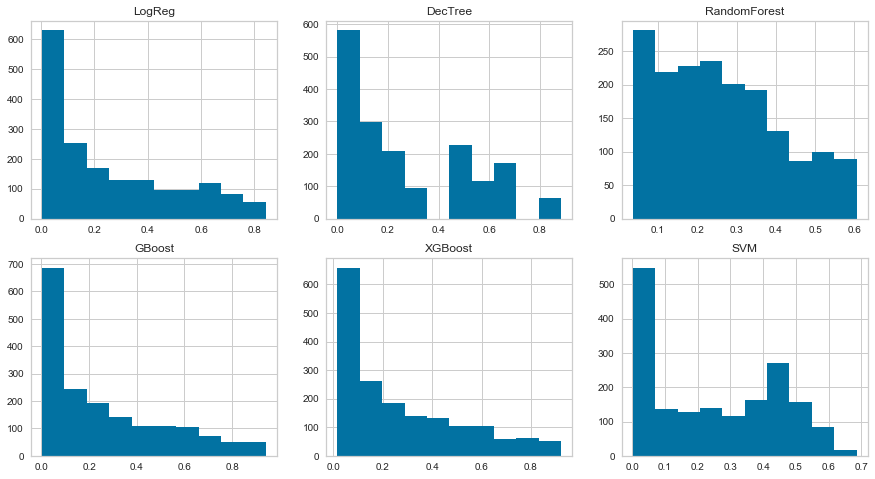

In [206]:
plt.figure(figsize=(15, 8))
i = 230

for model_name, probs in zip(['LogReg', 'DecTree', 'RandomForest', 'GBoost', 'XGBoost', 'SVM'],
                             [lr_probs, dt_probs, rf_probs, gb_probs, xgb_probs, svm_probs]):
    i += 1
    plt.subplot(i)
    plt.hist(probs)
    plt.title(model_name)
    
plt.show()

In [207]:
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)
dt_fpr, dt_tpr, _ = roc_curve(y_test, dt_probs)
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs)
gb_fpr, gb_tpr, _ = roc_curve(y_test, gb_probs)
xgb_fpr, xgb_tpr, _ = roc_curve(y_test, xgb_probs)
svm_fpr, svm_tpr, _ = roc_curve(y_test, svm_probs)

We will now provide a dataframe that displays both train and test AUC for each model performed:

In [208]:
pd.DataFrame({'train_ROC': [lr_auc_train, dt_auc_train, rf_auc_train, gb_auc_train, xgb_auc_train, svm_auc_train],
              'test_ROC': [lr_auc, dt_auc, rf_auc, gb_auc, xgb_auc, svm_auc]},
             index=['Logistic Regression', 'Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoosting', 'Support Vector Machine'])

,train_ROC,test_ROC
Logistic Regression,0.847279,0.833082
Decision Tree,0.846242,0.828135
Random Forest,0.849347,0.837413
Gradient Boosting,0.870571,0.847073
XGBoosting,0.900244,0.844856
Support Vector Machine,0.801407,0.792491


As can be seen from the table, by considering the train ROC we can say that all the models present an AUC of approximately 0.85, with the exception of the SVM that has a slightly lower AUC of 0.80 and the XGBoost that has 0.89; similar trends can be observed in the test ROC, where almost all **the models present an AUC of 0.84 on average**, again with the exception of the SVM that has a lower value (0.80). By analyzing these results, it is difficult to discriminate between the models and to prefer one model with respect to another one. In order to try to select the best model(s), we will later study and compare other metrics.

There seems to be **no signs of overfitting**, just a little for the XGBoosting model.

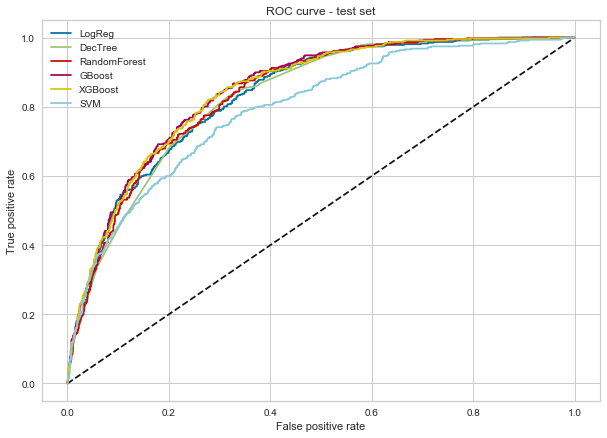

In [209]:
plt.figure(1, figsize=(10, 7))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(lr_fpr, lr_tpr, label='LogReg')
plt.plot(dt_fpr, dt_tpr, label='DecTree')
plt.plot(rf_fpr, rf_tpr, label='RandomForest')
plt.plot(gb_fpr, gb_tpr, label='GBoost')
plt.plot(xgb_fpr, xgb_tpr, label='XGBoost')
plt.plot(svm_fpr, svm_tpr, label='SVM')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve - test set')
plt.legend(loc='best')
plt.show()

### Confusion matrices
As a starting point to measure the performance of our categorical classifiers, we will now display the confusion matrices for all the models. Our ideal goal is to reduce the number of False Negative (FN), so to reduce the number of observation that we classified as 0 (no Churn), but that actually resulted in 1 (Churn). However, we also want to take into account also precision: so F1 Score is the ultimate metric that we consider.

In order to try to reduce that value, we performed several confusion matrices for each model by varying the cut-off: **here we present the ones having obtained by using the standard cut-off 0.5**

In [210]:
pretty_confusion_matrix(y_test, lr_preds)

prediction     
                  0    1
target 0       1171  123
       1        227  240

In [211]:
pretty_confusion_matrix(y_test, dt_preds)

prediction     
                  0    1
target 0       1158  136
       1        251  216

In [212]:
pretty_confusion_matrix(y_test, rf_preds)

prediction     
                  0    1
target 0       1240   54
       1        344  123

In [213]:
pretty_confusion_matrix(y_test, gb_preds)

prediction     
                  0    1
target 0       1170  124
       1        230  237

In [214]:
pretty_confusion_matrix(y_test, xgb_preds)

prediction     
                  0    1
target 0       1176  118
       1        239  228

In [215]:
pretty_confusion_matrix(y_test, svm_preds)

prediction     
                  0    1
target 0       1181  113
       1        269  198

### Accuracy
We have also analyzed the accuracy obtained for each model to understand the percentage of correctly classified observations over the total:

In [216]:
accuracies = []
for item in ['lr_preds','dt_preds','rf_preds','gb_preds', 'xgb_preds', 'svm_preds']:
    a = accuracy_score(y_test, eval(item))
    accuracies.append(a)
    print('accuracy for {}: {}'.format(item,a))

accuracy for lr_preds: 0.8012492901760363
accuracy for dt_preds: 0.7802385008517888
accuracy for rf_preds: 0.7739920499716071
accuracy for gb_preds: 0.7989778534923339
accuracy for xgb_preds: 0.797274275979557
accuracy for svm_preds: 0.7830777967064169


Here it is complicated to prefer one or some models with respect to others because the values of the accuracy for these models are very similar and around 0.79 for all of them.

### Precision and Recall
In order to try to discriminate between the models we have fitted, we now perform precision and recall metrics:

In [217]:
precisions = []
recalls = []
for item in ['lr_preds','dt_preds','rf_preds','gb_preds', 'xgb_preds', 'svm_preds']:
    p = precision_score(y_test, eval(item))
    r = recall_score(y_test, eval(item))
    precisions.append(p)
    recalls.append(r)
    print('precision for {}: {}'.format(item,p))
    print('recall for {}: {}'.format(item,r))
    print('\n')

precision for lr_preds: 0.6611570247933884
recall for lr_preds: 0.5139186295503212


precision for dt_preds: 0.6136363636363636
recall for dt_preds: 0.4625267665952891


precision for rf_preds: 0.6949152542372882
recall for rf_preds: 0.2633832976445396


precision for gb_preds: 0.6565096952908587
recall for gb_preds: 0.5074946466809421


precision for xgb_preds: 0.6589595375722543
recall for xgb_preds: 0.48822269807280516


precision for svm_preds: 0.6366559485530546
recall for svm_preds: 0.42398286937901497




We can say that, by keeping the default cut-off (0.5) for each model, we can discriminate among them according to the recall. In order to give a more complete evaluation about the performance of our models, we decided to calculate also the f1 score.

### F1 Score
We are now displaying the f1 score for each model:

In [218]:
# f1 score averages the precision and the recall of my model.
f1 = []
for item in ['lr_preds','dt_preds','rf_preds','gb_preds', 'xgb_preds', 'svm_preds']:
    f = f1_score(y_test, eval(item))
    f1.append(f)
    print('f1-score for {}: {}'.format(item,f))

f1-score for lr_preds: 0.5783132530120483
f1-score for dt_preds: 0.5274725274725275
f1-score for rf_preds: 0.38198757763975155
f1-score for gb_preds: 0.5724637681159419
f1-score for xgb_preds: 0.5608856088560886
f1-score for svm_preds: 0.5089974293059125


As can be seen, by using the standard cut-off, the Random Forest seems to be the model having the lowest f1 score.

## Ensemble
As a final chapter of our project, we decided to make an ensemble between the model we have trained: we want to try to improve the results by combining the models and by using all the predictive capabilities of all the models that we have tuned. 

In addition, we will also provide a summary table containing results and metrics for different models by using as cut-off the threshold suggested by the function `DiscriminationThreshold` from `yellowbrick.classifier`.

In order to perform the ensemble, we opted for a soft voting classifier (so we will use probabilities and not labels; a soft voting classifier predicts the class label based on the argmax of the sums of the predicted probabilities) because we have tuned and calibrated each single model. Moreover, due to both timing and lack of performance reasons with respect to other models, we decided **not to include the SVM** model in the ensemble. 

Indeed, we have integrated in the ensemble only those models having an f1 score higher than 0.6.

In [219]:
ensemble = VotingClassifier(estimators=[('lr',lr), ('dt', dt), ('rf', rf), ('gb', gb),('xgb',xgb)], voting='soft')

In [220]:
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer

In [221]:
# training:
ensemble.fit(X,Y)

VotingClassifier(estimators=[('lr',
                              Pipeline(memory=None,
                                       steps=[('scaler',
                                               RobustScaler(copy=True,
                                                            quantile_range=(25.0,
                                                                            75.0),
                                                            with_centering=True,
                                                            with_scaling=True)),
                                              ('model',
                                               LogisticRegression(C=1.0,
                                                                  class_weight=None,
                                                                  dual=False,
                                                                  fit_intercept=True,
                                                                  intercept_sca

In [222]:
# test on test set:
ensemble_preds = ensemble.predict(X_test)
ensemble_probs_train = [y for (x, y) in ensemble.predict_proba(X)]
ensemble_probs = [y for (x, y) in ensemble.predict_proba(X_test)]

ensemble_auc_train = roc_auc_score(Y, ensemble_probs_train)
ensemble_auc = roc_auc_score(y_test, ensemble_probs)
ensemble_f1_train = f1_score(Y, ensemble.predict(X))
ensemble_f1 = f1_score(y_test, ensemble_preds)
ensemble_precision_train = precision_score(Y, ensemble.predict(X))
ensemble_precision = precision_score(y_test, ensemble_preds)
ensemble_recall_train = recall_score(Y, ensemble.predict(X))
ensemble_recall = recall_score(y_test, ensemble_preds)


print('train auc: {}'.format(ensemble_auc_train))
print('test auc: {}'.format(ensemble_auc))
print('train f1: {}'.format(ensemble_f1_train))
print('test f1: {}'.format(ensemble_f1))
print('train recall: {}'.format(ensemble_recall_train))
print('test recall: {}'.format(ensemble_recall))
print('train precision: {}'.format(ensemble_precision_train))
print('test precision: {}'.format(ensemble_precision))

train auc: 0.8719724767269144
test auc: 0.845402433898507
train f1: 0.6008264462809918
test f1: 0.5588972431077694
train recall: 0.5185449358059915
test recall: 0.47751605995717344
train precision: 0.7141453831041258
test precision: 0.6737160120845922


In [234]:
ensemble_fpr_train, ensemble_tpr_train, _ = roc_curve(Y, ensemble_probs_train)
ensemble_fpr, ensemble_tpr, _ = roc_curve(y_test, ensemble_probs)

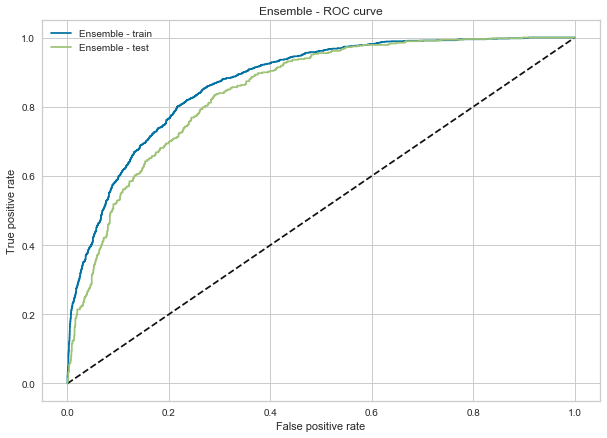

In [235]:
plt.figure(1, figsize=(10, 7))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(ensemble_fpr_train, ensemble_tpr_train, label='Ensemble - train')
plt.plot(ensemble_fpr, ensemble_tpr, label='Ensemble - test')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Ensemble - ROC curve')
plt.legend(loc='best')
plt.show()

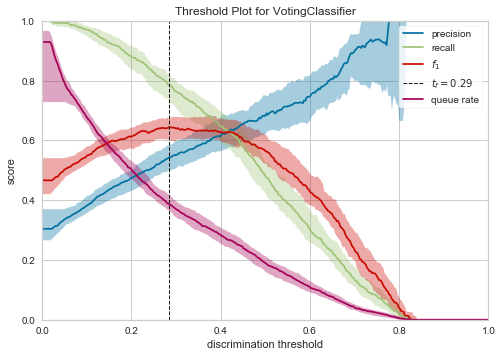

In [223]:
visualizer = DiscriminationThreshold(ensemble)

visualizer.fit(X, Y)        # Fit the data to the visualizer
visualizer.show()

In [226]:
the_cutoff = 0.29
new_ens_preds = [1 if x >= the_cutoff else 0 for x in ensemble_probs]

In [227]:
pretty_confusion_matrix(y_test, new_ens_preds)

prediction     
                  0    1
target 0        988  306
       1        118  349

In [228]:
print(precision_score(y_test, new_ens_preds))
print(recall_score(y_test, new_ens_preds))
print(accuracy_score(y_test, new_ens_preds))
print(f1_score(y_test, new_ens_preds))

0.5328244274809161
0.7473233404710921
0.7592277115275412
0.6221033868092692


# Final results

In [229]:
final_results = {}
for model in ['lr','dt','rf','gb','xgb','ensemble']:
    m = eval(model)
    if model == 'lr':
        preds= m.predict(X_lr.drop(drop_c, 1))
        pred_probs = [x[1] for x in m.predict_proba(X_lr.drop(drop_c, 1))]
        
        preds_test = m.predict(X_test_lr.drop(drop_c, 1))
        pred_probs_test = [x[1] for x in m.predict_proba(X_test_lr.drop(drop_c, 1))]
    else:
        preds= m.predict(X)
        pred_probs = [x[1] for x in m.predict_proba(X)]
        
        preds_test= m.predict(X_test)
        pred_probs_test = [x[1] for x in  m.predict_proba(X_test)] 
        
    final_results[model] = {}
    # auc test
    final_results[model].update({'auc_test' : roc_auc_score(y_test, pred_probs_test)})
    # auc train
    final_results[model].update({'auc_train' : roc_auc_score(Y, pred_probs)})
    # f1 test
    final_results[model].update({'f1_test' : f1_score(y_test, preds_test)})
    # f1 train
    final_results[model].update({'f1_train' : f1_score(Y, preds)})
    # precision test
    final_results[model].update({'precision_test' : precision_score(y_test, preds_test)})
    # precision train
    final_results[model].update({'precision_train' : precision_score(Y, preds)})
    # recall test
    final_results[model].update({'recall_test' : recall_score(y_test, preds_test)})
    # recall train
    final_results[model].update({'recall_train' : recall_score(Y, preds)})

In the following table are collected the metrics for the models, with the default cut-off = 0.5

In [230]:
pd.DataFrame(final_results).T

,auc_test,auc_train,f1_test,f1_train,precision_test,precision_train,recall_test,recall_train
lr,0.833082,0.847279,0.578313,0.604417,0.661157,0.661578,0.513919,0.556348
dt,0.828135,0.846242,0.527473,0.556379,0.613636,0.657588,0.462527,0.482168
rf,0.837413,0.849347,0.381988,0.420290,0.694915,0.766038,0.263383,0.289586
gb,0.847073,0.870571,0.572464,0.617147,0.656510,0.691763,0.507495,0.557061
xgb,0.844856,0.900244,0.560886,0.657589,0.658960,0.749772,0.488223,0.585592
ensemble,0.845402,0.871972,0.558897,0.600826,0.673716,0.714145,0.477516,0.518545


The following code is used to display the summary table containing metrics for all the models and the ensemble by using the cut-off suggested by `DiscriminationThreshold`.


For our purposes, we prefer to use the **threshold that maximize F1 Score for each model**, instead of using the default (0.5) or the proportion of the target variable `Churn` (0.26).

In [232]:
final_results = {}
for model in ['lr', "dt", "rf",'dt','rf','gb','xgb','svm','ensemble']:
    m = eval(model)
    if model == 'lr':
        pred_probs = [x[1] for x in m.predict_proba(X_lr.drop(drop_c, 1))]
        preds = [1 if x >= 0.34 else 0 for x in pred_probs]
        
        pred_probs_test = [x[1] for x in m.predict_proba(X_test_lr.drop(drop_c, 1))]
        preds_test = [1 if x >= 0.34 else 0 for x in pred_probs_test]
    
    elif model == "dt":
        pred_probs = [x[1] for x in m.predict_proba(X.drop(drop_c, 1))]
        preds = [1 if x >= 0.42 else 0 for x in pred_probs]
        
        pred_probs_test = [x[1] for x in m.predict_proba(X_test.drop(drop_c, 1))]
        preds_test = [1 if x >= 0.42 else 0 for x in pred_probs_test]
        
    elif model == "rf":
        pred_probs = [x[1] for x in m.predict_proba(X.drop(drop_c, 1))]
        preds = [1 if x >= 0.33 else 0 for x in pred_probs]
        
        pred_probs_test = [x[1] for x in m.predict_proba(X_test.drop(drop_c, 1))]
        preds_test = [1 if x >= 0.33 else 0 for x in pred_probs_test] 
    
    elif model == "gb":
        pred_probs = [x[1] for x in m.predict_proba(X.drop(drop_c, 1))]
        preds = [1 if x >= 0.35 else 0 for x in pred_probs]
        
        pred_probs_test = [x[1] for x in m.predict_proba(X_test.drop(drop_c, 1))]
        preds_test = [1 if x >= 0.35 else 0 for x in pred_probs_test]
        
    elif model == "xgb":
        pred_probs = [x[1] for x in m.predict_proba(X.drop(drop_c, 1))]
        preds = [1 if x >= 0.36 else 0 for x in pred_probs]
        
        pred_probs_test = [x[1] for x in m.predict_proba(X_test.drop(drop_c, 1))]
        preds_test = [1 if x >= 0.36 else 0 for x in pred_probs_test]
    
    elif model == "svm":
        pred_probs = [x[1] for x in m.predict_proba(X.drop(drop_c, 1))]
        preds = [1 if x >= 0.43 else 0 for x in pred_probs]
        
        pred_probs_test = [x[1] for x in m.predict_proba(X_test.drop(drop_c, 1))]
        preds_test = [1 if x >= 0.43 else 0 for x in pred_probs_test]
        
    elif model == "ensemble":
        pred_probs = [x[1] for x in m.predict_proba(X.drop(drop_c, 1))]
        preds = [1 if x >= 0.29 else 0 for x in pred_probs]
        
        pred_probs_test = [x[1] for x in m.predict_proba(X_test.drop(drop_c, 1))]
        preds_test = [1 if x >= 0.29 else 0 for x in pred_probs_test]
    
        
    final_results[model] = {}
    # auc test
    final_results[model].update({'auc_test' : roc_auc_score(y_test, pred_probs_test)})
    # auc train
    final_results[model].update({'auc_train' : roc_auc_score(Y, pred_probs)})
    # f1 test
    final_results[model].update({'f1_test' : f1_score(y_test, preds_test)})
    # f1 train
    final_results[model].update({'f1_train' : f1_score(Y, preds)})
    # precision test
    final_results[model].update({'precision_test' : precision_score(y_test, preds_test)})
    # precision train
    final_results[model].update({'precision_train' : precision_score(Y, preds)})
    # recall test
    final_results[model].update({'recall_test' : recall_score(y_test, preds_test)})
    # recall train
    final_results[model].update({'recall_train' : recall_score(Y, preds)})
    # accuracy test
    final_results[model].update({'accuracy_test' : accuracy_score(y_test, preds_test)})
    # accuracy train
    final_results[model].update({'accuracy_train' : accuracy_score(Y, preds)})
 

In [233]:
pd.DataFrame(final_results).T

,auc_test,auc_train,f1_test,f1_train,precision_test,precision_train,recall_test,recall_train,accuracy_test,accuracy_train
lr,0.833082,0.847279,0.605364,0.636220,0.547660,0.569656,0.676660,0.720399,0.766042,0.781333
dt,0.828135,0.846242,0.609943,0.637947,0.550950,0.573789,0.683084,0.718260,0.768313,0.783605
rf,0.837413,0.849347,0.617332,0.647096,0.566071,0.580408,0.678801,0.731098,0.776831,0.788338
gb,0.847073,0.870571,0.627723,0.661717,0.583794,0.604363,0.678801,0.731098,0.786485,0.801590
xgb,0.844856,0.900244,0.621167,0.703826,0.577206,0.654601,0.672377,0.761056,0.782510,0.829989
svm,0.792491,0.801407,0.556745,0.568287,0.556745,0.565279,0.556745,0.571327,0.764906,0.769595
ensemble,0.845402,0.871972,0.622103,0.664127,0.532824,0.563682,0.747323,0.808131,0.759228,0.783037


# Conclusions
By looking at the chosen metrics, such as F1 Test and AUC Test, we can conclude that **Gradient Boosting is the best model** for predicting the churn of a current customer. 
The ensemble model reaches an F1 Score close to the Gradient Boosting algorithm but given the fact that the ensemble in built on top of the GB Model, we prefer to keep a simpler model.

## Interpretation

It has been shown that the two boosting models (Gradient Boosting & Xgboost) are the better performing models that we have built. Although boosting is an effective technique for prediction, it has a downside which is the lack of interpretability.
To our aid come two libraries of so called "explainers": `Lime` and `Shap`.

### Lime Explainer

Sources:
* https://arxiv.org/abs/1602.04938
* https://cran.r-project.org/web/packages/lime/vignettes/Understanding_lime.html
* https://towardsdatascience.com/understanding-model-predictions-with-lime-a582fdff3a3b
* https://towardsdatascience.com/decrypting-your-machine-learning-model-using-lime-5adc035109b5

`Lime` is a technique built in order to **explain the prediction made by any machine learning model**. Clearly this becomes useful in the explanation of complex non-parametric models and black boxes; for example gradient boosting models or neural networks.
An explanation is created by approximating the underlying model locally by an interpretable one. Interpretable models are e.g. linear models with strong regularisation, decision tree’s, etc. The interpretable models are trained on small perturbations* of the original instance and should only provide a good local approximation.

The output of LIME is a list of features, reflecting the contribution of each feature to the prediction of a data sample. This provides local interpretability, and it also allows to determine which feature changes will have most impact on the prediction.
The explainer so considers one observation at one time and shows not only the output of the classification but also what contributed the most and how. 

Since we used this instance as an example we decided to show all the variables but normally it would be better to select the most important ones in order to have a clearer view.

*https://stats.stackexchange.com/questions/374579/understanding-functioning-of-limelocal-interpretable-model-agnostic-explanation

In [236]:
explainer = lime.lime_tabular.LimeTabularExplainer(X.values,                                            
                 feature_names=X.columns.values.tolist(),                                        
                 class_names=Y.unique())

In [237]:
exp = explainer.explain_instance(X_test.iloc[0],
                                 gb_best.predict_proba, 
                                 num_features=24)

In [238]:
exp.show_in_notebook(show_all=False)

### Shap Explainer

Sources: 
* https://github.com/slundberg/shap#citations
* http://papers.nips.cc/paper/7062-a-unified-approach-to-interpreting-model-predictions
* https://shap.readthedocs.io/en/latest/
* https://blog.dominodatalab.com/shap-lime-python-libraries-part-1-great-explainers-pros-cons/
* https://christophm.github.io/interpretable-ml-book/shap.html

SHAP (SHapley Additive exPlanations) by Lundberg and Lee (2016) is a method to explain individual predictions.
The idea is **using game theory to interpret target model**. The SHAP explanation method computes Shapley values from coalitional game theory. The feature values of a data instance act as players in a coalition. Shapley values tell us how to fairly distribute the “payout” (the prediction) among the features. A player can be an individual feature value, e.g. for tabular data. 

The technical definition of a Shapley value is the “average marginal contribution of a feature value over all possible coalitions.” In other words, Shapley values consider all possible predictions for an instance using all possible combinations of inputs. Because of this exhaustive approach, SHAP can guarantee properties like consistency and local accuracy.  
Shap specifies the explanation as:
$$ g(z')=\phi_0+\sum_{j=1}^M\phi_jz_j' $$
where g is the explanation model, z is the coalition vector, M is the maximum coalition size and phi is the feature attribution for a feature j, the Shapley values.

In [239]:
shap.initjs()

In [241]:
explainer = shap.TreeExplainer(gb_best)
shap_values = explainer.shap_values(X)

To get an overview of which features are most important for a model we can plot the SHAP values of every feature for every sample. The plot below sorts features by the sum of SHAP value magnitudes over all samples, and uses SHAP values to show the distribution of the impacts each feature has on the model output. 

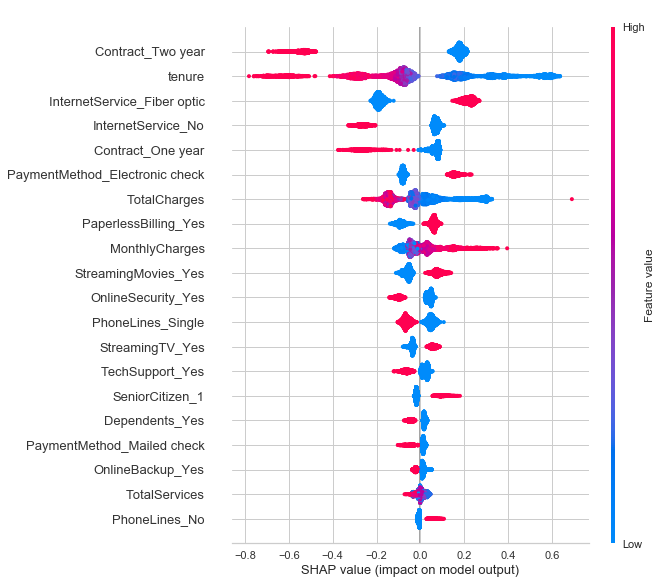

In [242]:
shap.summary_plot(shap_values, X)

In [243]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

The above explanation shows how each features contributes to the output value. Features pushing the prediction higher are shown in red, those pushing the prediction lower are in blue.

If we take many explanations such as the one shown above, rotate them 90 degrees, and then stack them horizontally, we can see explanations for an entire dataset (plot is interactive):

In [244]:
shap.force_plot(explainer.expected_value, shap_values, X)

## Further Developments

* Augment the data with extra informations
* Extend the feature engineering process
* Explore possible clusters in the client base